In [23]:
! pip install lightning[extra]

^C


In [ ]:
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks.model_checkpoint import ModelCheckpoint
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from datasets import load_metric
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import os
from PIL import Image

In [ ]:

from roboflow import Roboflow
rf = Roboflow(api_key="sEh6aEpS0PBEpznY4PzI")
project = rf.workspace("anup-kaygm").project("potato_disease-binb3")
version = project.version(11)
dataset = version.download("png-mask-semantic")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
class SemanticSegmentationDataset(Dataset):
    def __init__(self, root_dir, feature_extractor):
        self.root_dir = root_dir
        self.feature_extractor = feature_extractor

        self.classes_csv_file = os.path.join(self.root_dir, "_classes.csv")
        with open(self.classes_csv_file, 'r') as fid:
            data = [l.split(',') for i,l in enumerate(fid) if i !=0]
        self.id2label = {x[0]:x[1] for x in data}

        image_file_names = [f for f in os.listdir(self.root_dir) if '.jpg' in f]
        mask_file_names = [f for f in os.listdir(self.root_dir) if '.png' in f]

        self.images = sorted(image_file_names)
        self.masks = sorted(mask_file_names)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(os.path.join(self.root_dir, self.images[idx]))
        segmentation_map = Image.open(os.path.join(self.root_dir, self.masks[idx]))

        encoded_inputs = self.feature_extractor(image, segmentation_map, return_tensors="pt")

        for k,v in encoded_inputs.items():
            encoded_inputs[k].squeeze_()

        return encoded_inputs


In [ ]:
class SegformerFinetuner(pl.LightningModule):
    def __init__(self, id2label, train_dataloader=None, val_dataloader=None, test_dataloader=None, metrics_interval=100):
        super(SegformerFinetuner, self).__init__()
        self.id2label = id2label
        self.metrics_interval = metrics_interval
        self.train_dl = train_dataloader
        self.val_dl = val_dataloader
        self.test_dl = test_dataloader

        self.num_classes = len(id2label.keys())
        self.label2id = {v:k for k,v in self.id2label.items()}

        self.model = SegformerForSemanticSegmentation.from_pretrained(
            "nvidia/segformer-b0-finetuned-ade-512-512",
            return_dict=False,
            num_labels=self.num_classes,
            id2label=self.id2label,
            label2id=self.label2id,
            ignore_mismatched_sizes=True,
        )

        self.train_mean_iou = load_metric("mean_iou", trust_remote_code=True)
        self.val_mean_iou = load_metric("mean_iou", trust_remote_code=True)
        self.test_mean_iou = load_metric("mean_iou", trust_remote_code=True)

    def forward(self, images, masks):
        outputs = self.model(pixel_values=images, labels=masks)
        return(outputs)

    def training_step(self, batch, batch_nb):
        images, masks = batch['pixel_values'], batch['labels']
        outputs = self(images, masks)
        loss, logits = outputs[0], outputs[1]

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)

        self.train_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )
        if batch_nb % self.metrics_interval == 0:
            metrics = self.train_mean_iou.compute(
                num_labels=self.num_classes,
                ignore_index=255,
                reduce_labels=False,
            )

            metrics = {'loss': loss, "mean_iou": metrics["mean_iou"], "mean_accuracy": metrics["mean_accuracy"]}
            for k,v in metrics.items():
                self.log(k,v)

            return(metrics)
        else:
            return({'loss': loss})

    def validation_step(self, batch, batch_nb):
        images, masks = batch['pixel_values'], batch['labels']
        outputs = self(images, masks)
        loss, logits = outputs[0], outputs[1]

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)

        self.val_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        self.log("val_loss", loss)
        return({'val_loss': loss})

    def on_validation_epoch_end(self):
        metrics = self.val_mean_iou.compute(
            num_labels=self.num_classes,
            ignore_index=255,
            reduce_labels=False,
        )

        val_mean_iou = metrics["mean_iou"]
        val_mean_accuracy = metrics["mean_accuracy"]

        self.log("val_mean_iou", val_mean_iou)
        self.log("val_mean_accuracy", val_mean_accuracy)

    def test_step(self, batch, batch_nb):
        images, masks = batch['pixel_values'], batch['labels']
        outputs = self(images, masks)
        loss, logits = outputs[0], outputs[1]

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        predicted = upsampled_logits.argmax(dim=1)

        self.test_mean_iou.add_batch(
            predictions=predicted.detach().cpu().numpy(),
            references=masks.detach().cpu().numpy()
        )

        return({'test_loss': loss})

    def on_test_epoch_end(self):
        metrics = self.test_mean_iou.compute(
            num_labels=self.num_classes,
            ignore_index=255,
            reduce_labels=False,
        )

        test_mean_iou = metrics["mean_iou"]
        test_mean_accuracy = metrics["mean_accuracy"]

        self.log("test_mean_iou", test_mean_iou)
        self.log("test_mean_accuracy", test_mean_accuracy)

    def configure_optimizers(self):
        return torch.optim.Adam([p for p in self.parameters() if p.requires_grad], lr=2e-05, eps=1e-08)

    def train_dataloader(self):
        return self.train_dl

    def val_dataloader(self):
        return self.val_dl

    def test_dataloader(self):
        return self.test_dl

In [ ]:
feature_extractor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
feature_extractor.do_reduce_labels = False
feature_extractor.size = 128

train_dataset = SemanticSegmentationDataset(f"{dataset.location}/train/", feature_extractor)
val_dataset = SemanticSegmentationDataset(f"{dataset.location}/valid/", feature_extractor)
test_dataset = SemanticSegmentationDataset(f"{dataset.location}/test/", feature_extractor)

batch_size = 8
num_workers = 2
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)

segformer_finetuner = SegformerFinetuner(
    train_dataset.id2label,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    metrics_interval=10,
)

early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=0.00,
    patience=10,
    verbose=False,
    mode="min",
)

checkpoint_callback = ModelCheckpoint(save_top_k=1, monitor="val_loss")

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([4, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate


In [ ]:
trainer = pl.Trainer(
    num_sanity_val_steps=0,
    accelerator="gpu",
    devices=1,
    callbacks=[early_stop_callback, checkpoint_callback],
    max_epochs=500,
    val_check_interval=len(train_dataloader),
)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(segformer_finetuner)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                             | Params
-----------------------------------------------------------
0 | model | SegformerForSemanticSegmentation | 3.7 M 
-----------------------------------------------------------
3.7 M     Trainable params
0         Non-trainable params
3.7 M     Total params
14.861    Total estimated model params size (MB)
The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:   0%|          | 0/588 [00:00<?, ?it/s] 

invalid value encountered in divide


Epoch 0:  21%|██        | 121/588 [01:08<04:26,  1.76it/s, v_num=10]

invalid value encountered in divide


Epoch 35: 100%|██████████| 588/588 [05:49<00:00,  1.68it/s, v_num=10]


In [ ]:

checkpoint_path = r"lightning_logs\version_10\checkpoints\epoch=25-step=15288.ckpt"

loaded_model = SegformerFinetuner.load_from_checkpoint(checkpoint_path, id2label=train_dataset.id2label)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([4, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
import torch
from transformers import SegformerImageProcessor


id2label = id2label = train_dataset.id2label
checkpoint_path = "C:\\Users\\User\\Desktop\\5thsemproject\\lightning_logs\\version_10\\checkpoints\\epoch=25-step=15288.ckpt"

model = SegformerFinetuner.load_from_checkpoint(checkpoint_path, id2label=id2label)
model.eval() 


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([4, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


SegformerFinetuner(
  (model): SegformerForSemanticSegmentation(
    (segformer): SegformerModel(
      (encoder): SegformerEncoder(
        (patch_embeddings): ModuleList(
          (0): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
            (layer_norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
          )
          (1): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          )
          (2): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
          )
          (3): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (la

In [ ]:

feature_extractor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
feature_extractor.do_reduce_labels = False
feature_extractor.size = 128

test_dataset = SemanticSegmentationDataset(f"{dataset.location}/test/", feature_extractor)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)


The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


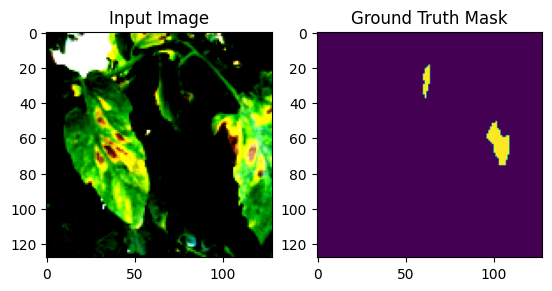

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5702832].


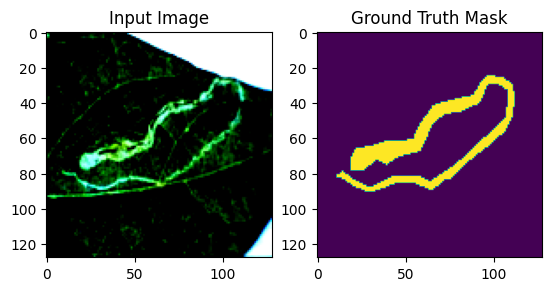

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5702832].


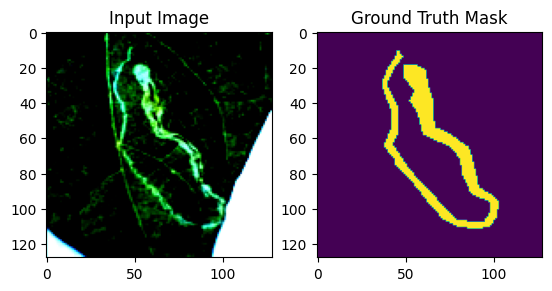

In [ ]:
import matplotlib.pyplot as plt
for i in range(3):
    sample = test_dataset[i]
    image = sample['pixel_values']
    mask = sample['labels']
    
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.title('Input Image')
    plt.imshow(image.permute(1, 2, 0).numpy())  # Convert from CHW to HWC

    plt.subplot(1, 2, 2)
    plt.title('Ground Truth Mask')
    plt.imshow(mask.numpy())
    plt.show()


In [ ]:

model.eval()
batch = next(iter(test_dataloader))
images = batch['pixel_values'].to(model.device)
masks = batch['labels'].to(model.device)

with torch.no_grad():
    outputs = model(images, masks)
    loss, logits = outputs

print("Logits shape:", logits.shape)
print("Logits range:", logits.min().item(), logits.max().item())


Logits shape: torch.Size([8, 4, 32, 32])
Logits range: -16.410743713378906 16.041643142700195


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


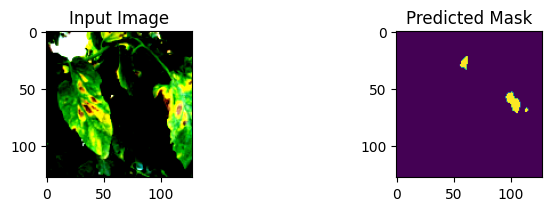

In [ ]:

model.eval()
batch = next(iter(test_dataloader))
images = batch['pixel_values'].to(model.device)
masks = batch['labels'].to(model.device)

with torch.no_grad():
    outputs = model(images, masks)
    loss, logits = outputs

    upsampled_logits = nn.functional.interpolate(
        logits,
        size=masks.shape[-2:],
        mode="bilinear",
        align_corners=False
    )
    
    predicted = upsampled_logits.argmax(dim=1)


i = 0
plt.figure()
plt.subplot(1, 3, 1)
plt.title('Input Image')
plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())

plt.subplot(1, 3, 3)
plt.title('Predicted Mask')
plt.imshow(predicted[i].cpu().numpy())
plt.show()


100%|██████████| 84/84 [00:04<00:00, 17.82it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8610327..2.169412].


Mean IoU: 0.6966665735313193
Mean Accuracy: 0.784007217163752


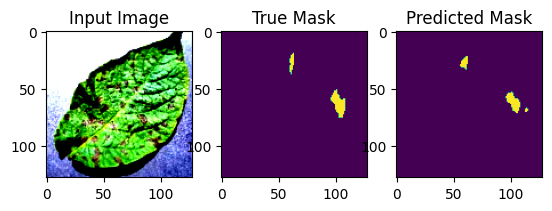

In [ ]:
import torch
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_metric

id2label = train_dataset.id2label
num_classes = len(id2label)


test_mean_iou = load_metric("mean_iou", trust_remote_code=True)

model.eval()
all_predictions = []
all_labels = []

for batch in tqdm(test_dataloader):
    images = batch['pixel_values'].to(model.device)
    masks = batch['labels'].to(model.device)

    with torch.no_grad():
        outputs = model(images, masks)
        loss, logits = outputs

        upsampled_logits = torch.nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
        
        predicted = upsampled_logits.argmax(dim=1)
        all_predictions.append(predicted.cpu().numpy())
        all_labels.append(masks.cpu().numpy())

all_predictions = np.concatenate(all_predictions, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

mean_iou = test_mean_iou.compute(
    predictions=all_predictions,
    references=all_labels,
    num_labels=num_classes,
    ignore_index=255,
    reduce_labels=False,
)


print(f"Mean IoU: {mean_iou['mean_iou']}")
print(f"Mean Accuracy: {mean_iou['mean_accuracy']}")

i = 0
plt.figure()
plt.subplot(1, 3, 1)
plt.title('Input Image')
plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())

plt.subplot(1, 3, 2)
plt.title('True Mask')
plt.imshow(all_labels[i])

plt.subplot(1, 3, 3)
plt.title('Predicted Mask')
plt.imshow(all_predictions[i])
plt.show()


In [ ]:

color_map = {
    0: [0, 0, 0],        # Class 0 (Background) - Black
    1: [255, 0, 0],      # Class 1 (Early Blight) - Red
    2: [0, 255, 0],      # Class 2 (Late Blight) - Green
    3: [0, 0, 255],      # Class 3 (Leafminer) - Blue
}

id2label = {
    "0": "Background",
    "1": "Early Blight",
    "2": "Late Blight",
    "3": "Leafminer"
}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


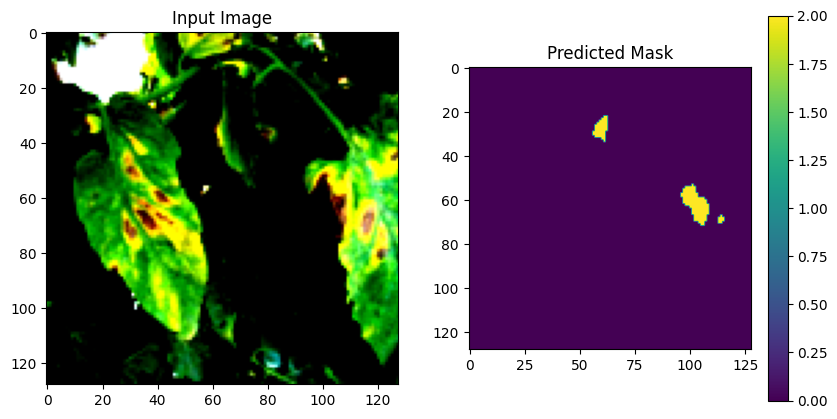

Unique labels in the predicted mask: ['Background' 'Late Blight']


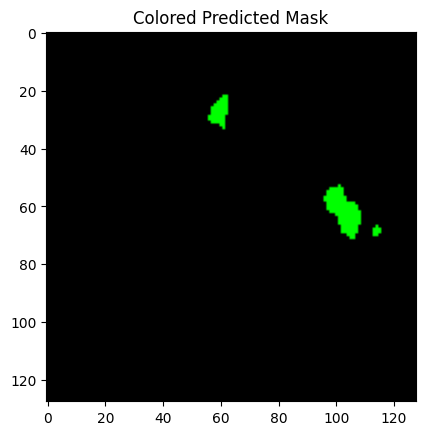

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5702832].


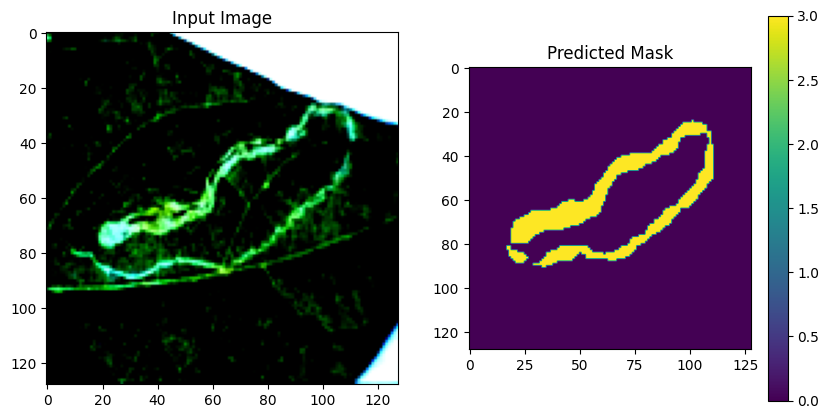

Unique labels in the predicted mask: ['Background' 'Leafminer']


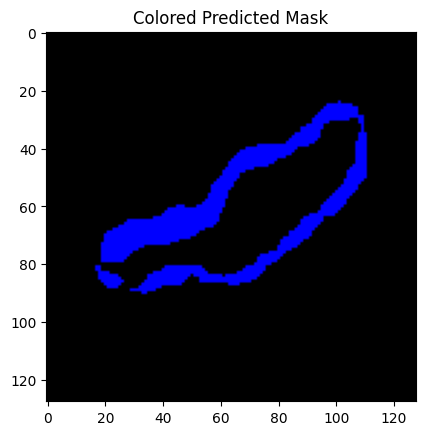

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5702832].


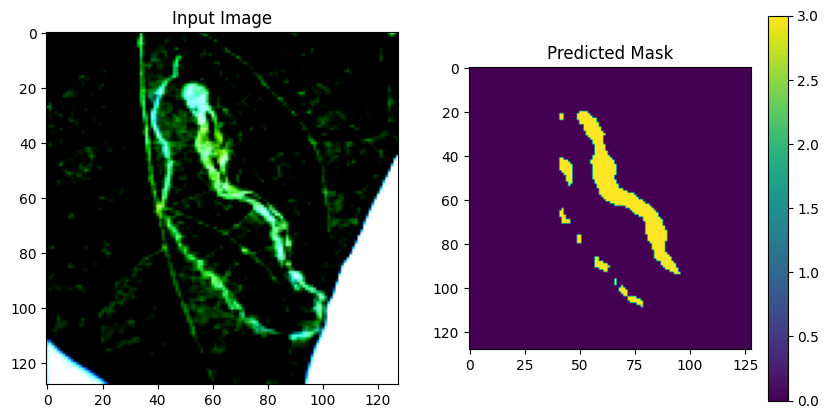

Unique labels in the predicted mask: ['Background' 'Leafminer']


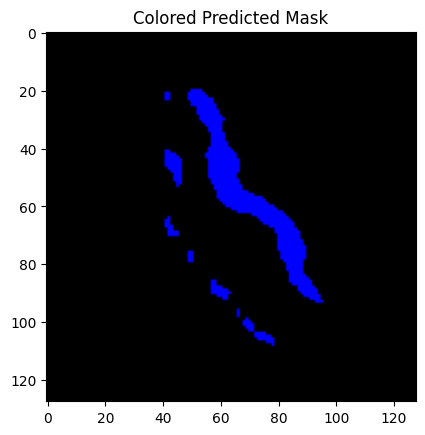

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5877128].


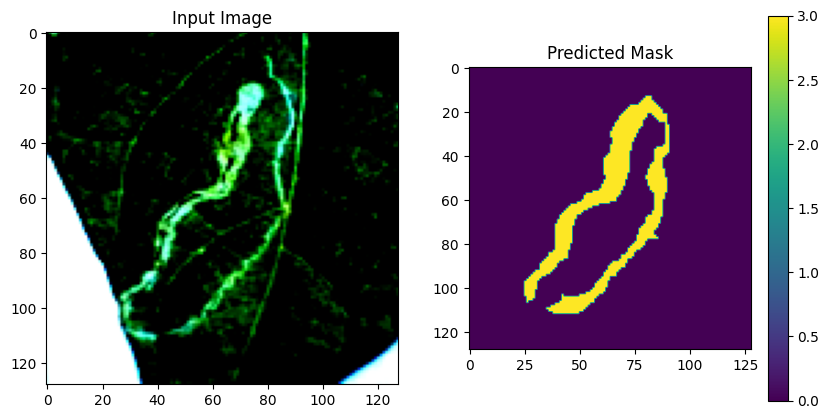

Unique labels in the predicted mask: ['Background' 'Leafminer']


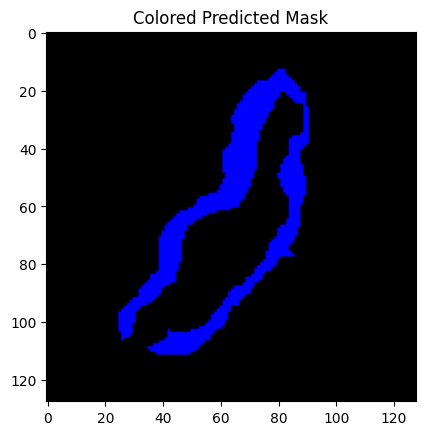

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5877128].


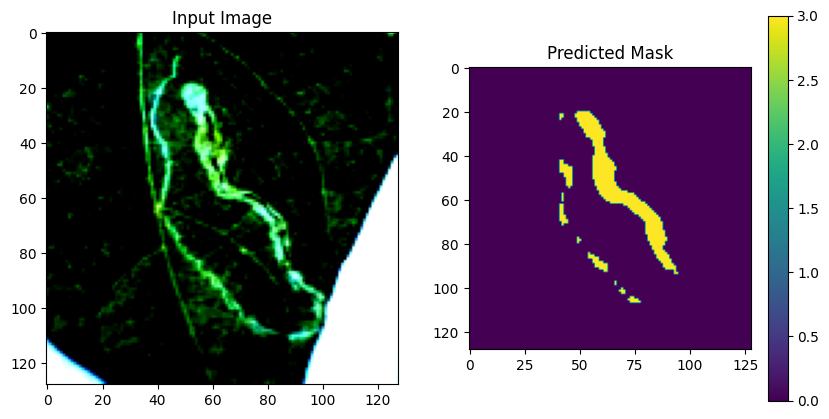

Unique labels in the predicted mask: ['Background' 'Leafminer']


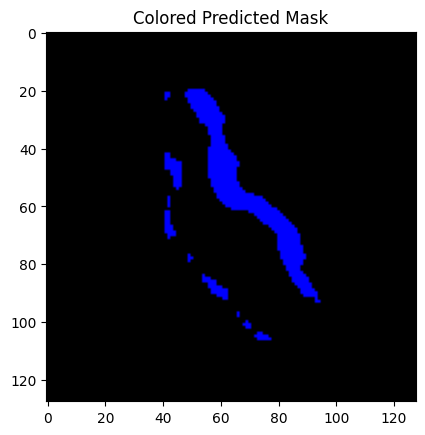

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5702832].


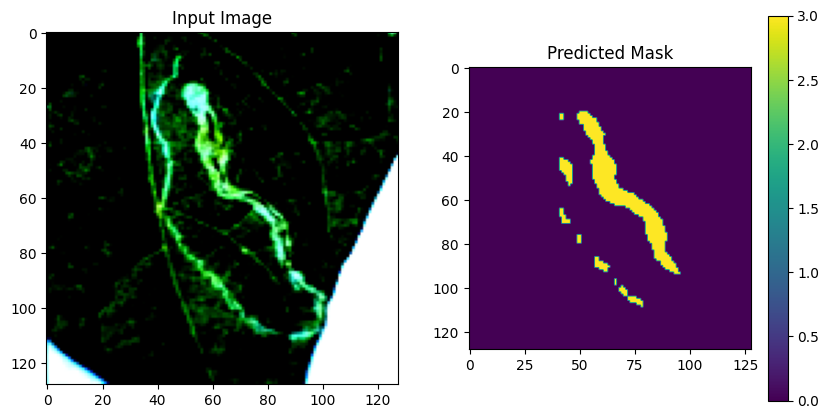

Unique labels in the predicted mask: ['Background' 'Leafminer']


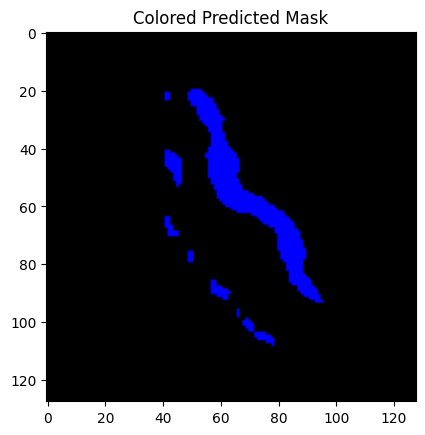

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8952821..2.5877128].


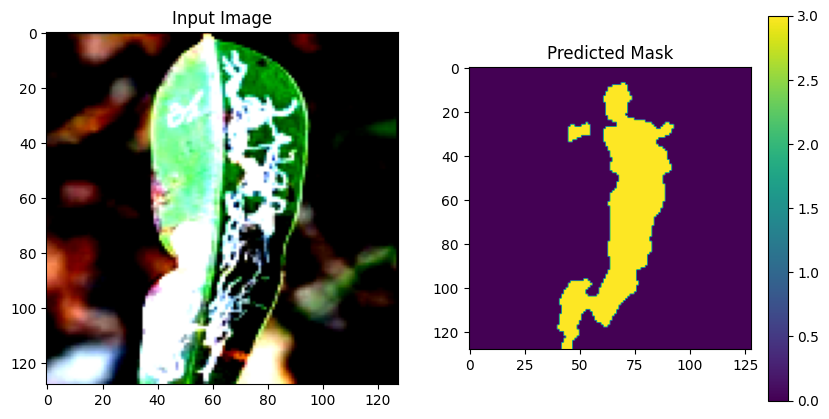

Unique labels in the predicted mask: ['Background' 'Leafminer']


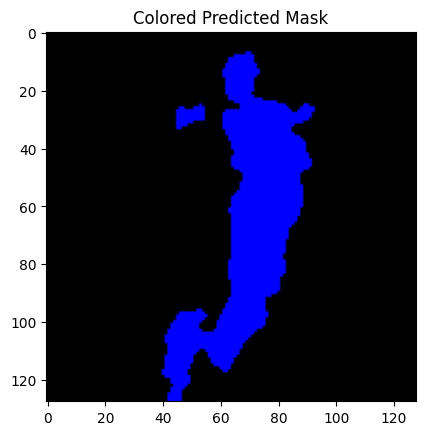

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8952821..2.5877128].


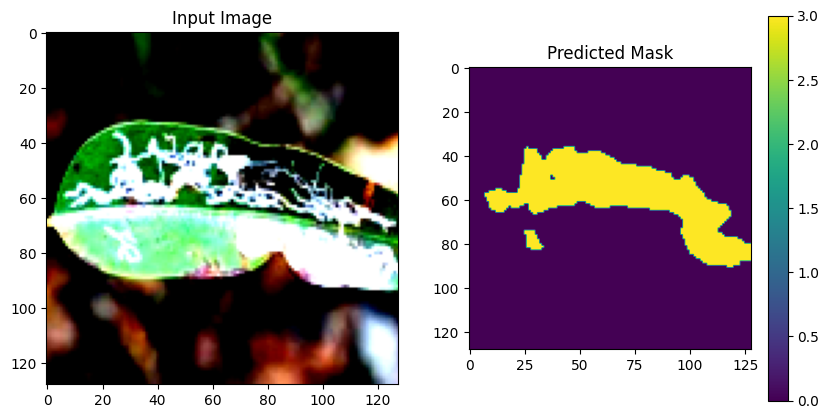

Unique labels in the predicted mask: ['Background' 'Leafminer']


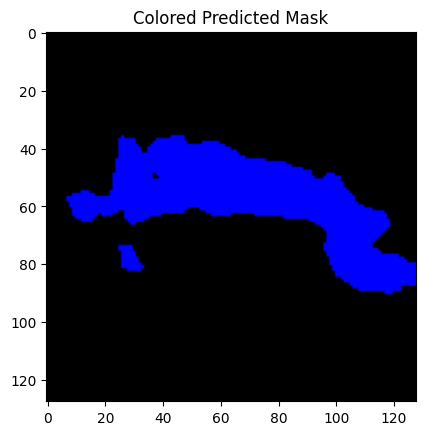

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8952821..2.5702832].


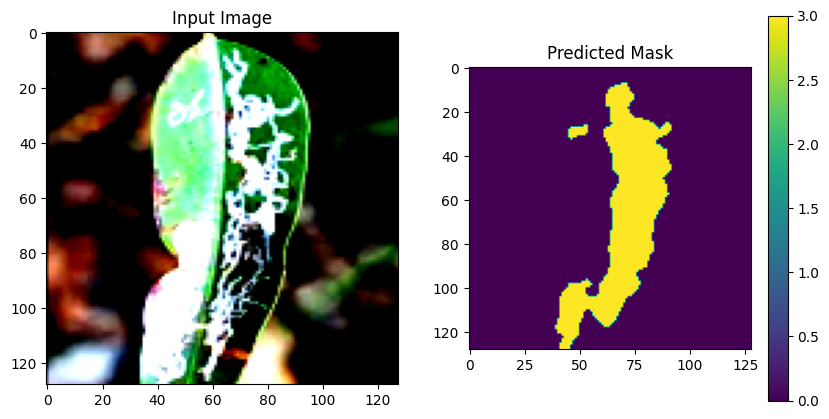

Unique labels in the predicted mask: ['Background' 'Leafminer']


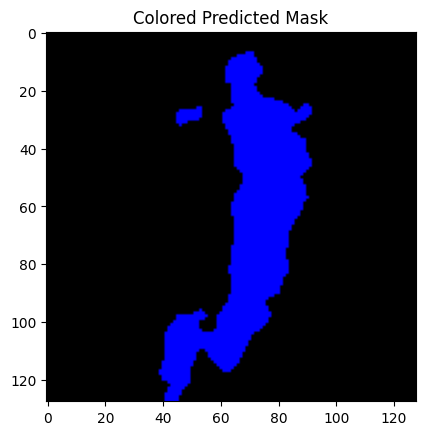

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.3060222].


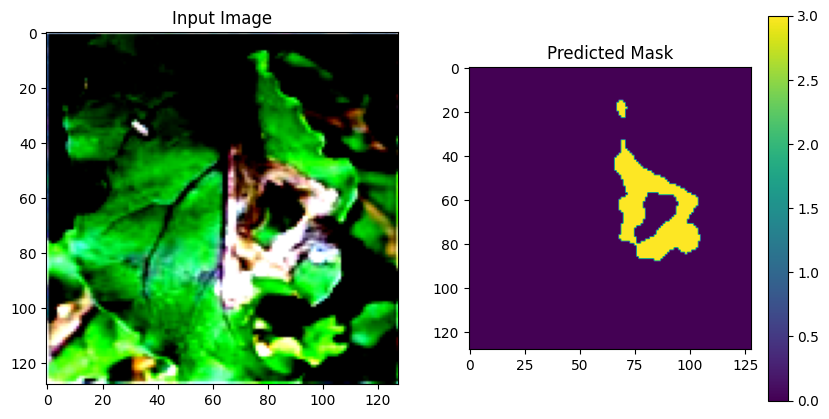

Unique labels in the predicted mask: ['Background' 'Leafminer']


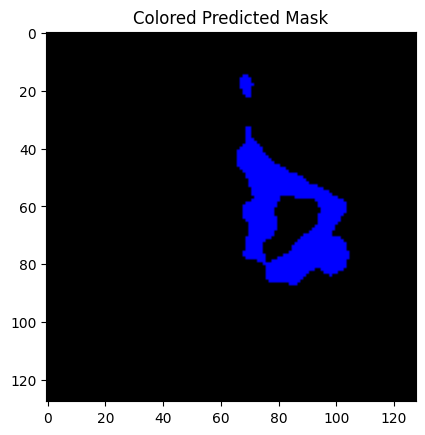

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.3262744].


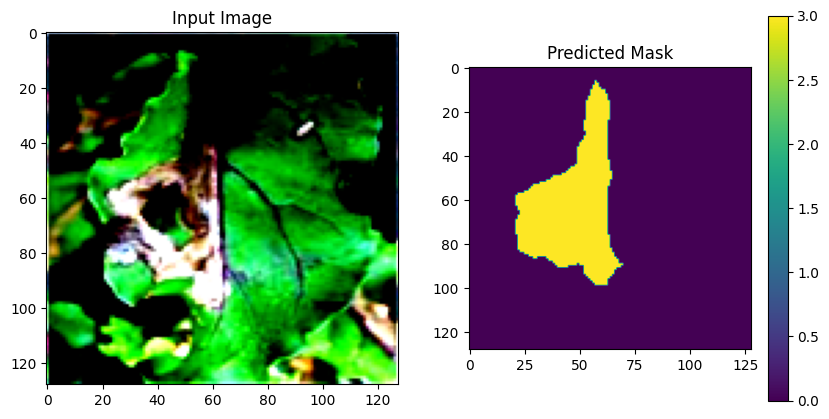

Unique labels in the predicted mask: ['Background' 'Leafminer']


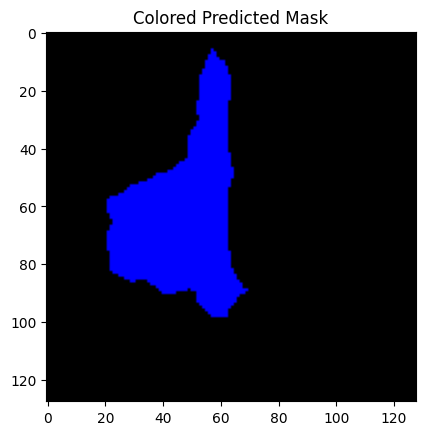

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3262744].


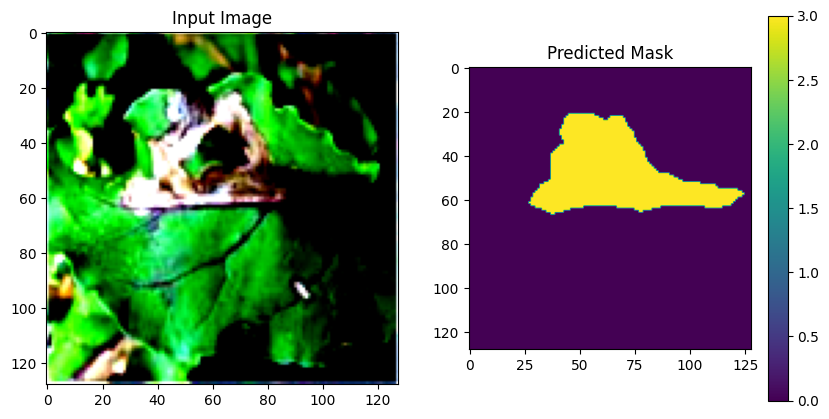

Unique labels in the predicted mask: ['Background' 'Leafminer']


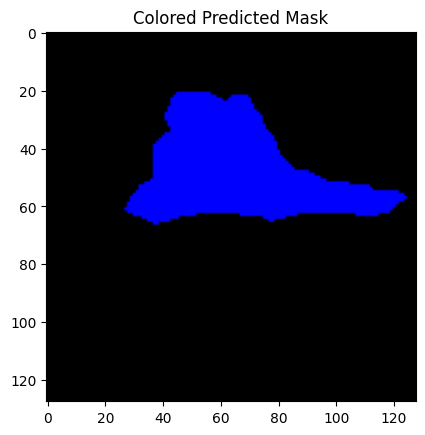

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8096584..2.3760502].


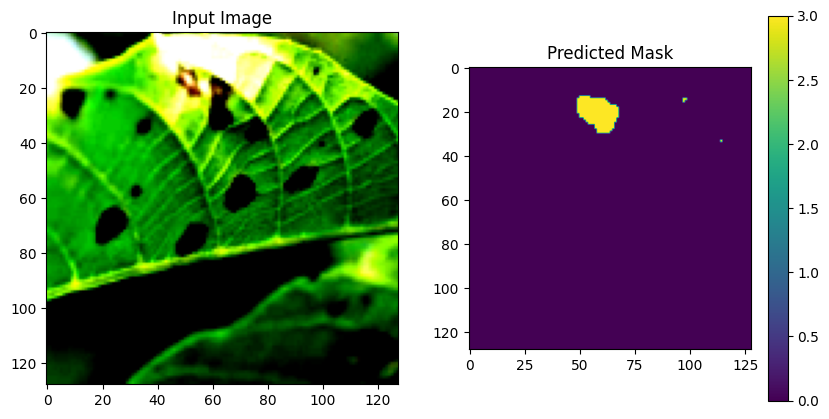

Unique labels in the predicted mask: ['Background' 'Leafminer']


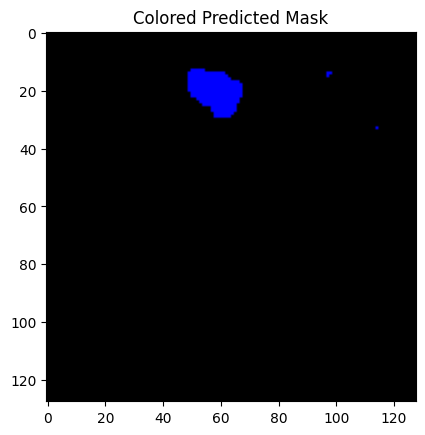

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8096584..2.3760502].


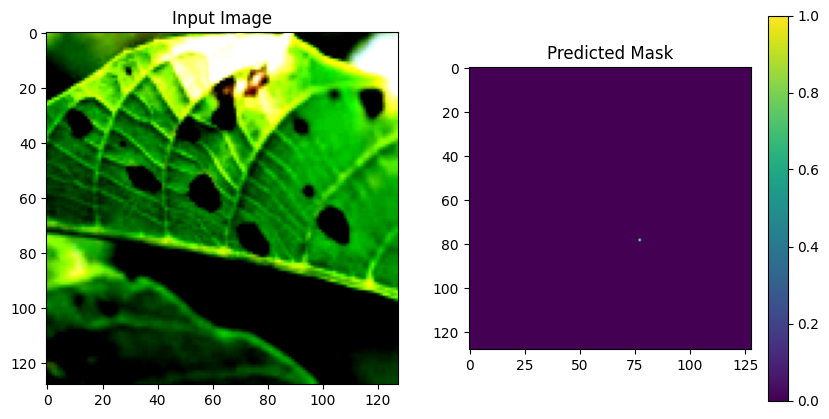

Unique labels in the predicted mask: ['Background' 'Early Blight']


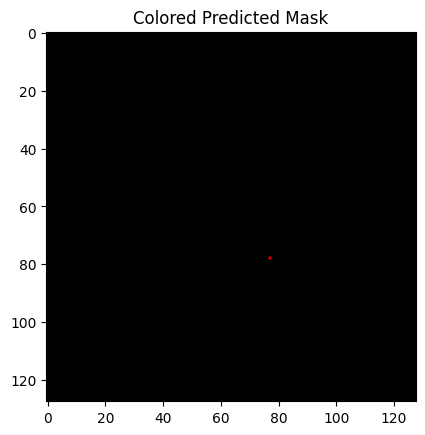

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.923538].


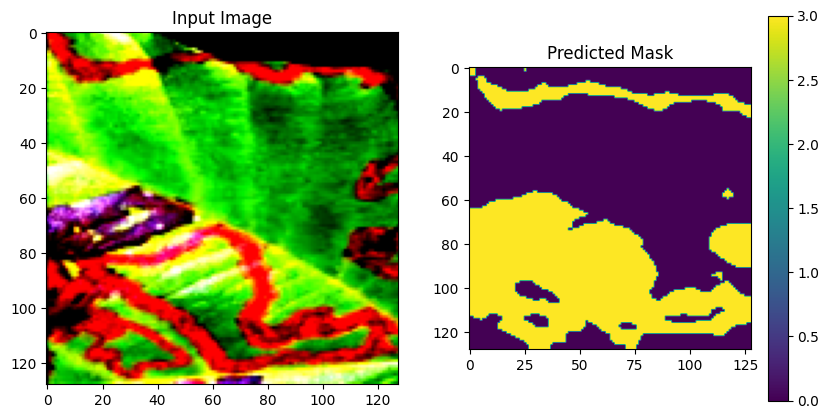

Unique labels in the predicted mask: ['Background' 'Leafminer']


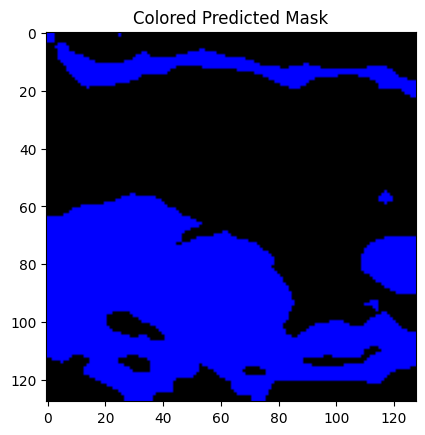

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.7983193].


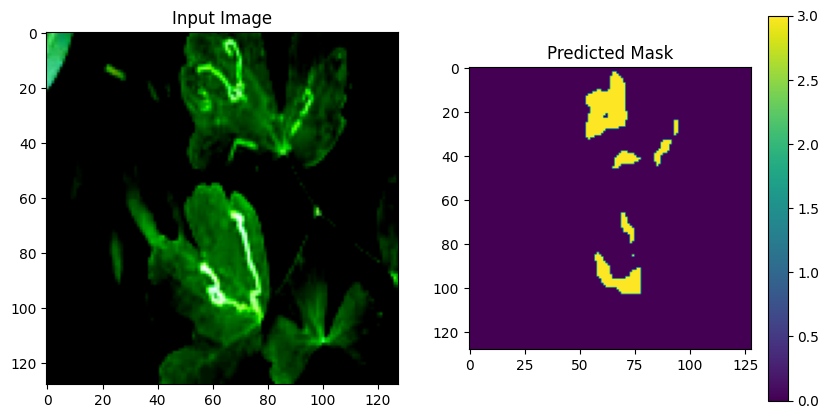

Unique labels in the predicted mask: ['Background' 'Leafminer']


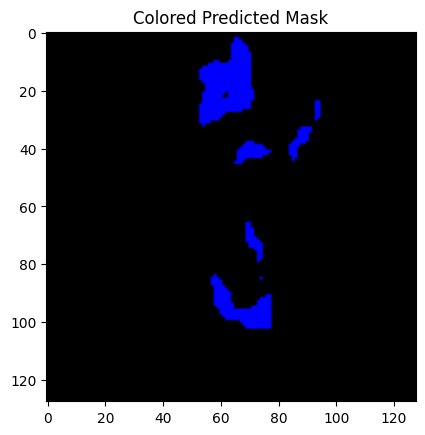

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.7983193].


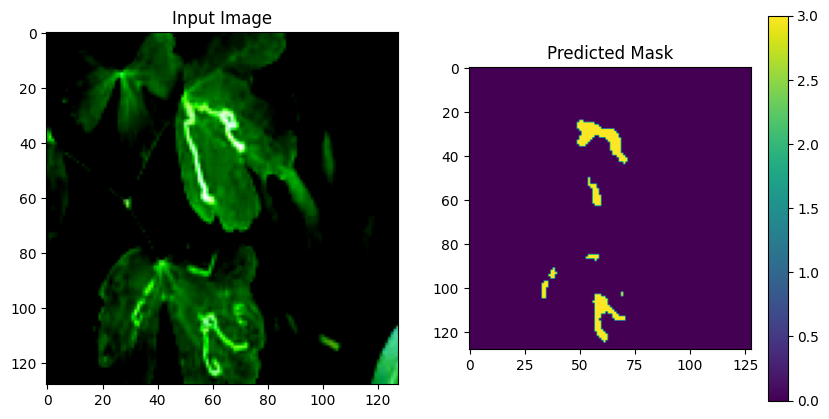

Unique labels in the predicted mask: ['Background' 'Leafminer']


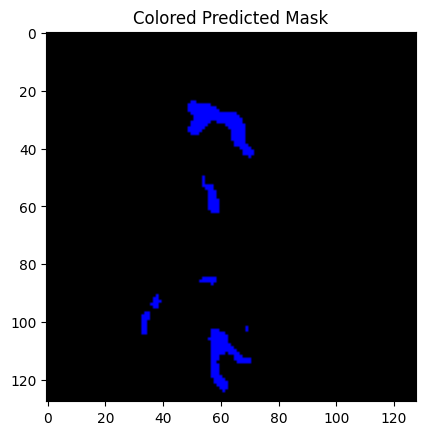

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.7983193].


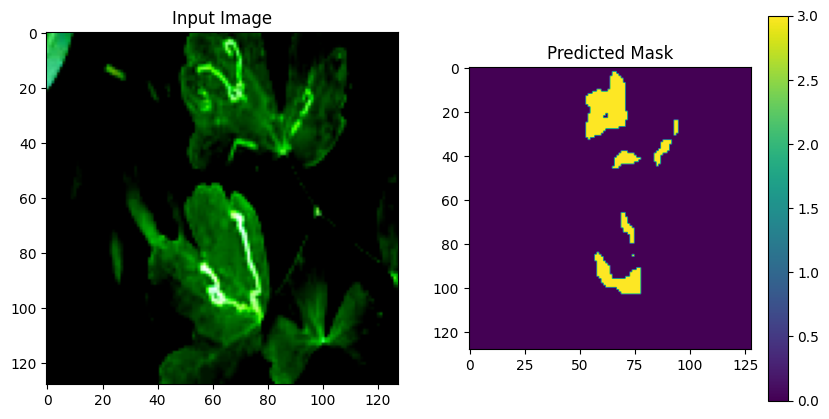

Unique labels in the predicted mask: ['Background' 'Leafminer']


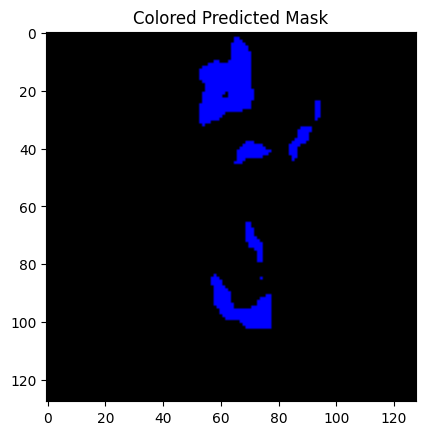

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.7983193].


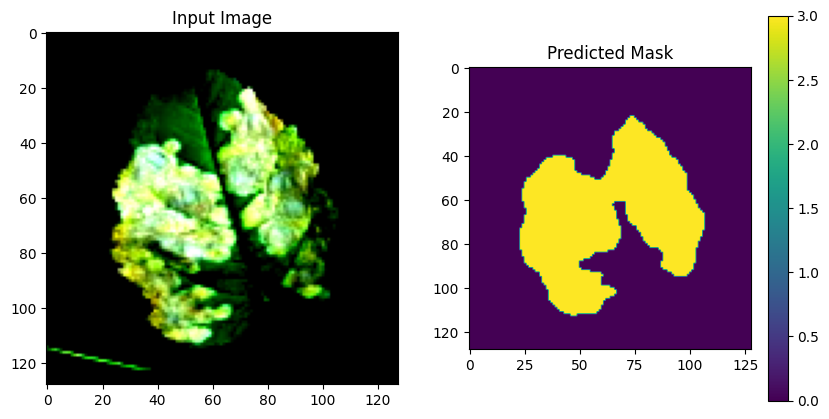

Unique labels in the predicted mask: ['Background' 'Leafminer']


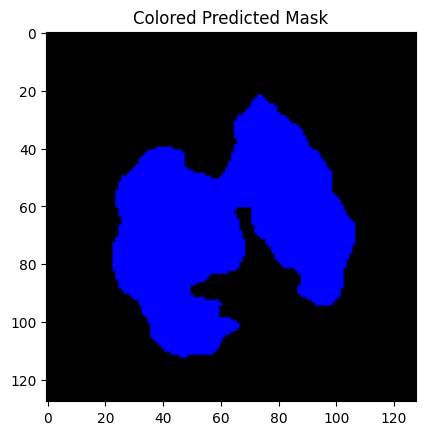

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.7808123].


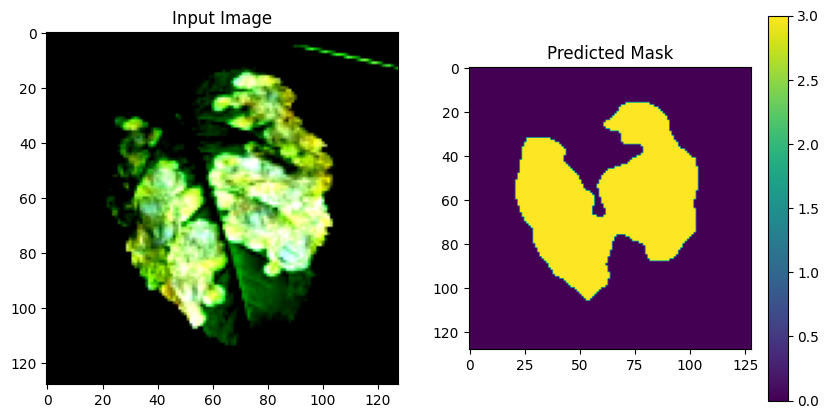

Unique labels in the predicted mask: ['Background' 'Leafminer']


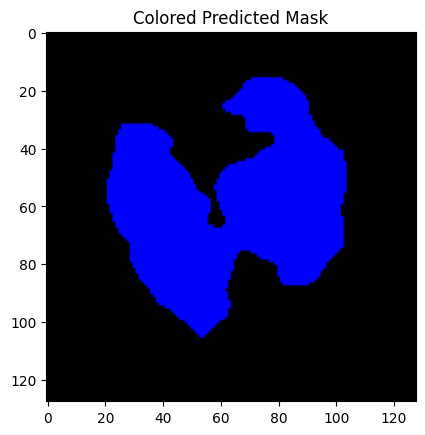

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.7808123].


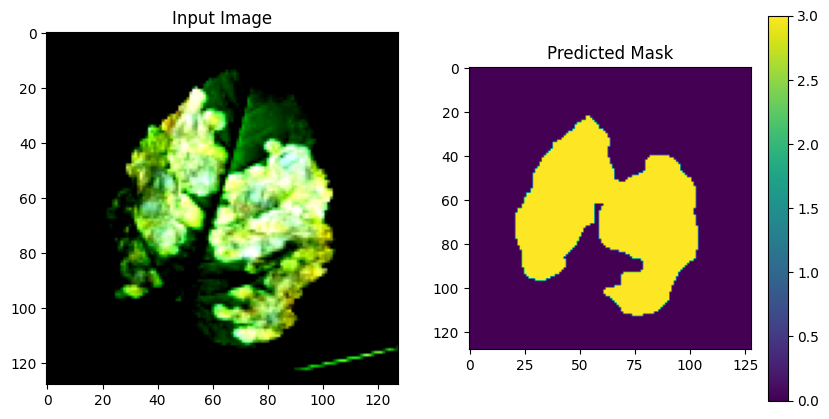

Unique labels in the predicted mask: ['Background' 'Leafminer']


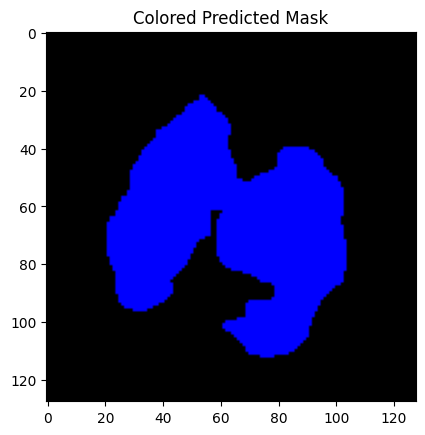

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.7808123].


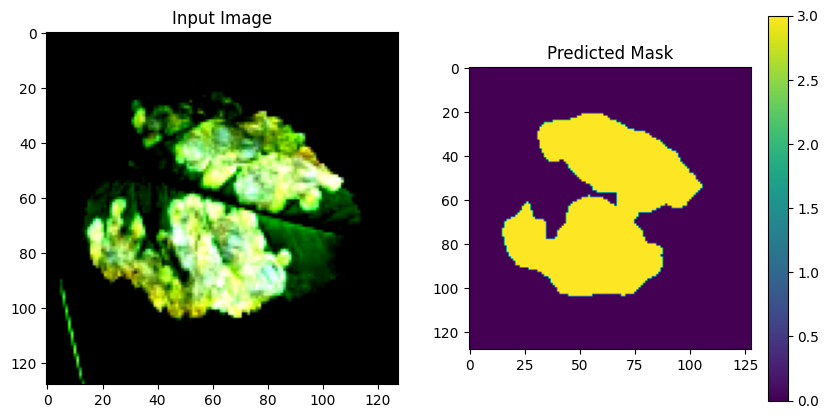

Unique labels in the predicted mask: ['Background' 'Leafminer']


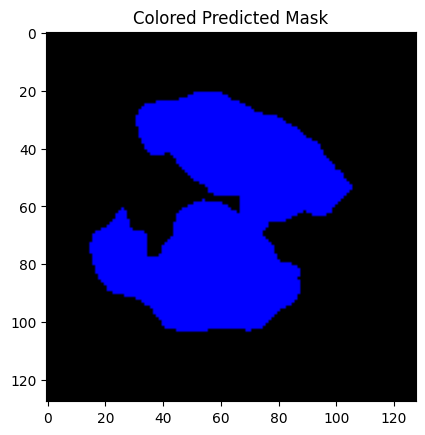

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8956583..2.3410363].


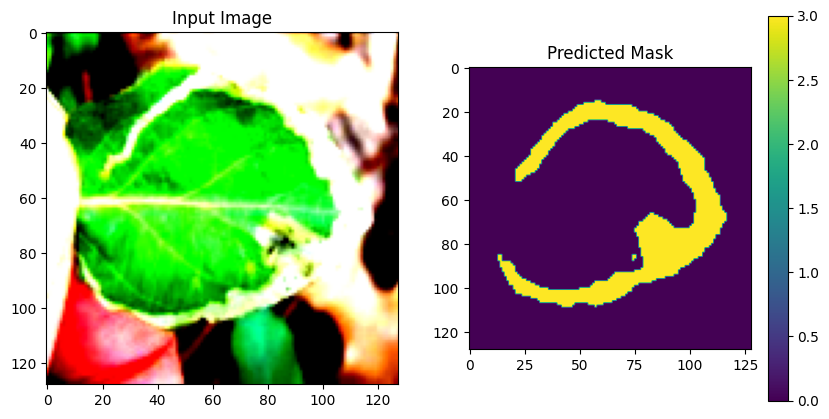

Unique labels in the predicted mask: ['Background' 'Leafminer']


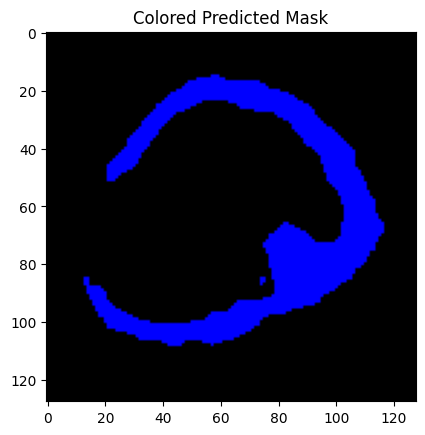

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.3235295].


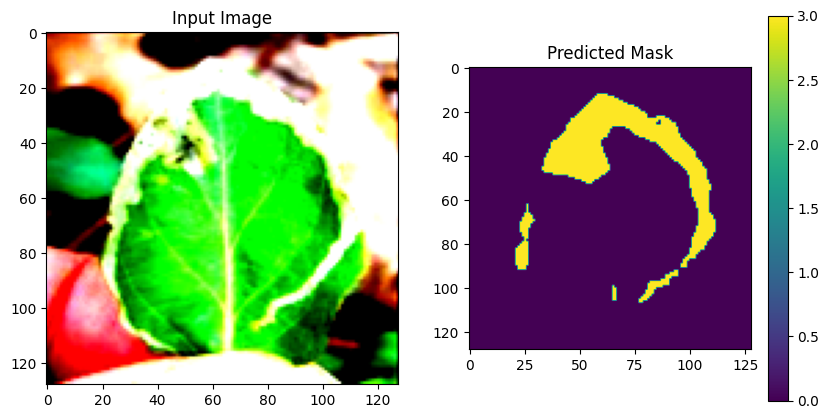

Unique labels in the predicted mask: ['Background' 'Leafminer']


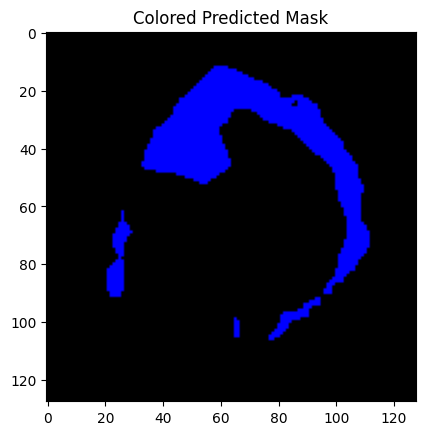

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8956583..2.3235295].


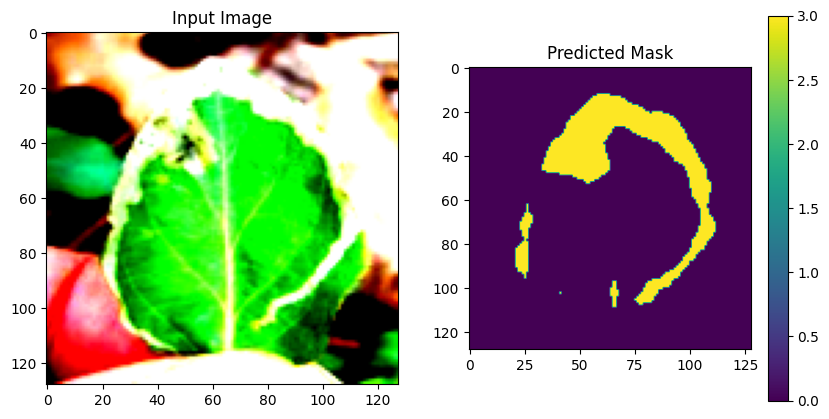

Unique labels in the predicted mask: ['Background' 'Leafminer']


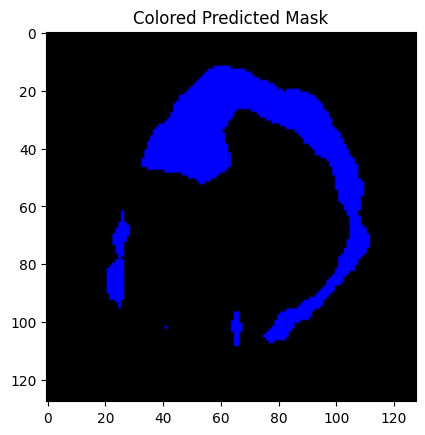

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.11191].


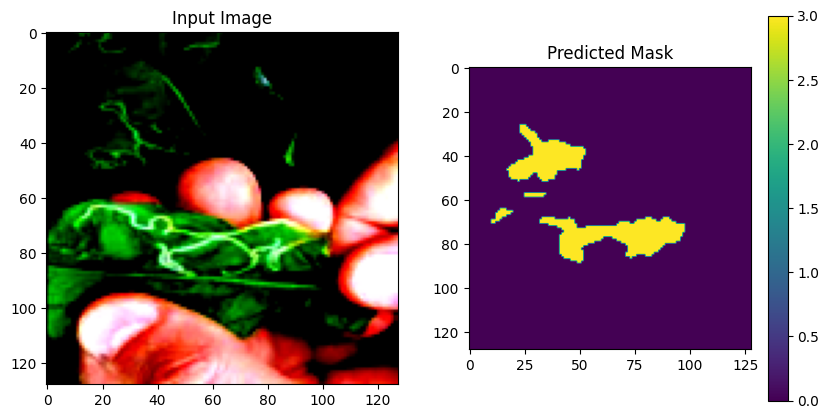

Unique labels in the predicted mask: ['Background' 'Leafminer']


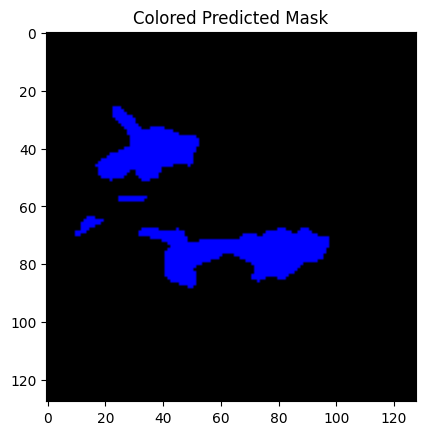

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2391288].


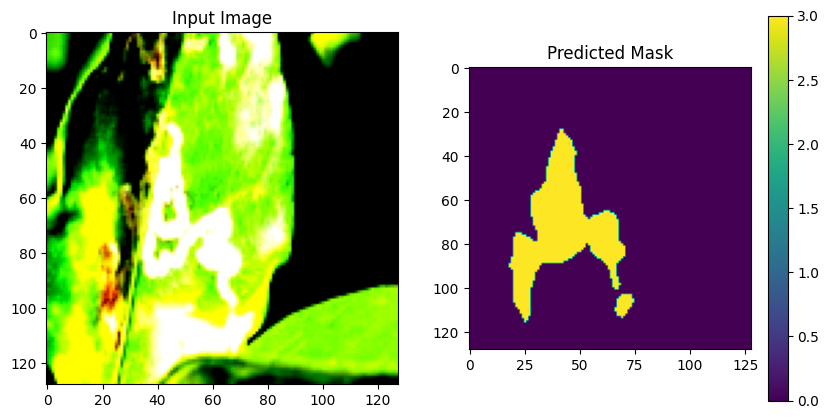

Unique labels in the predicted mask: ['Background' 'Leafminer']


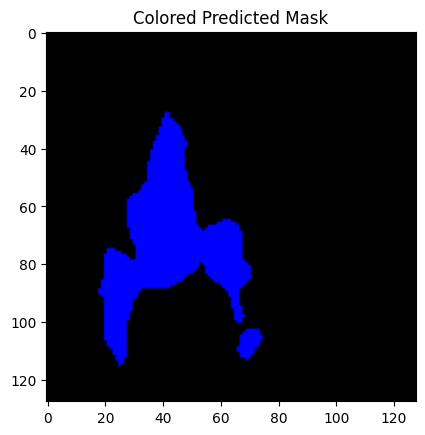

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1659663].


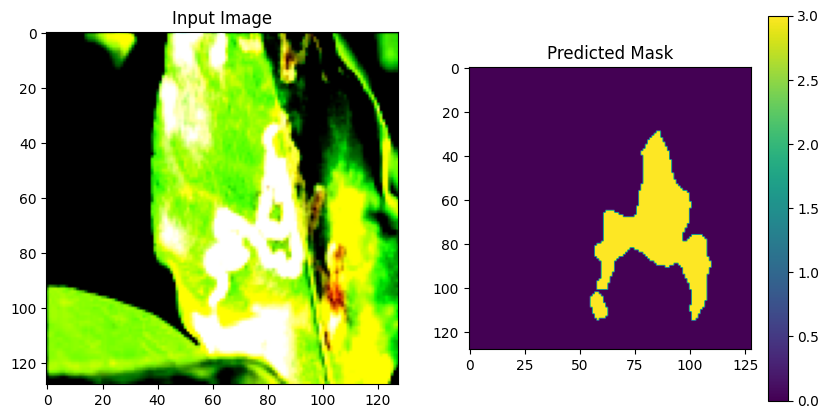

Unique labels in the predicted mask: ['Background' 'Leafminer']


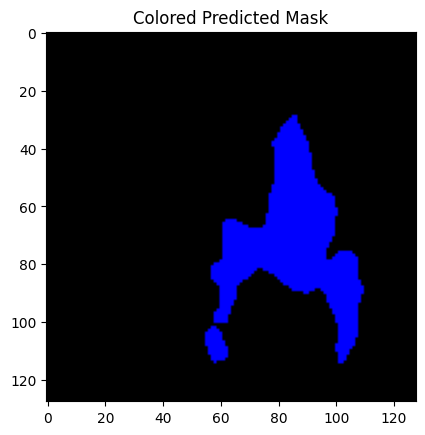

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2391288].


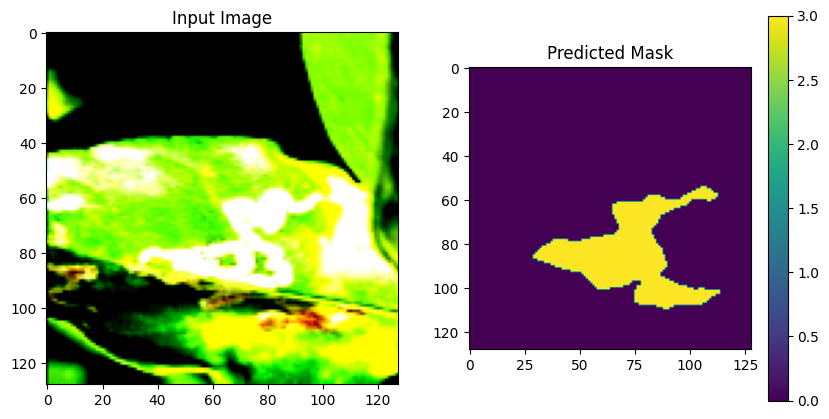

Unique labels in the predicted mask: ['Background' 'Leafminer']


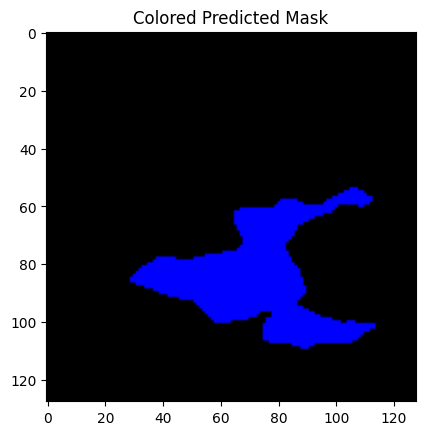

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2391288].


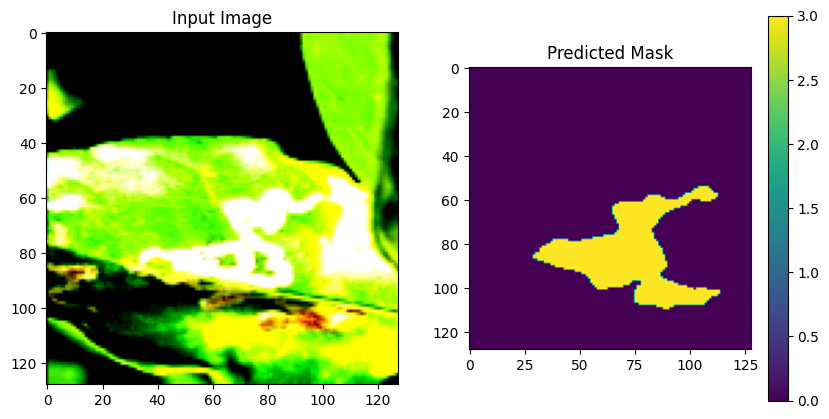

Unique labels in the predicted mask: ['Background' 'Leafminer']


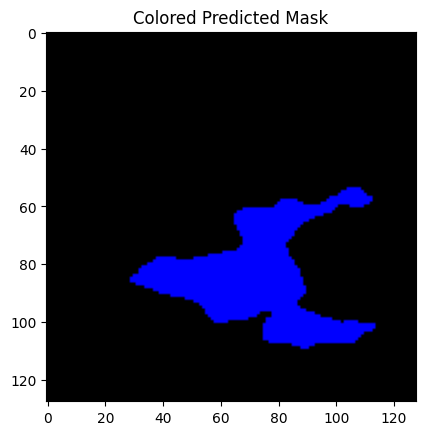

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2391288].


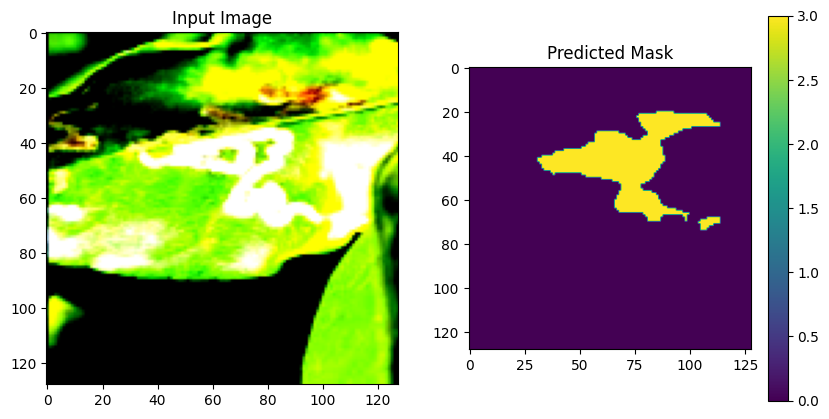

Unique labels in the predicted mask: ['Background' 'Leafminer']


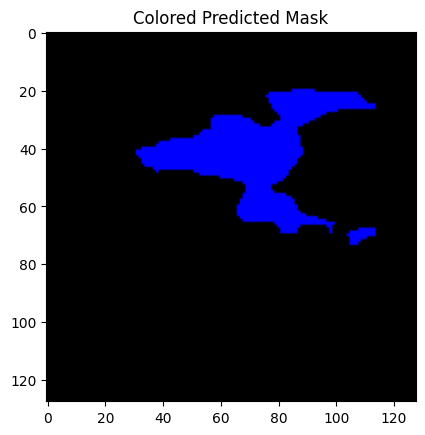

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2565577].


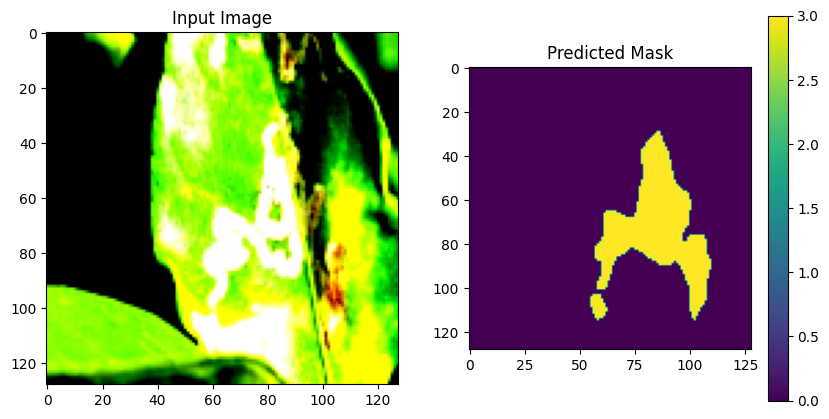

Unique labels in the predicted mask: ['Background' 'Leafminer']


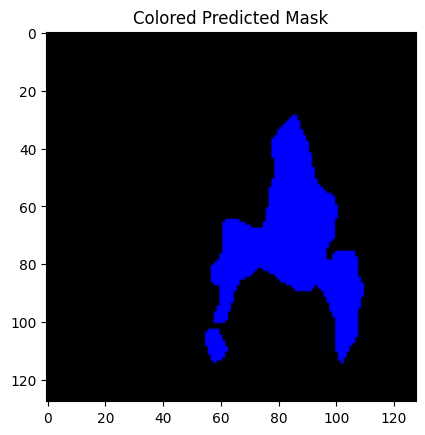

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2042704].


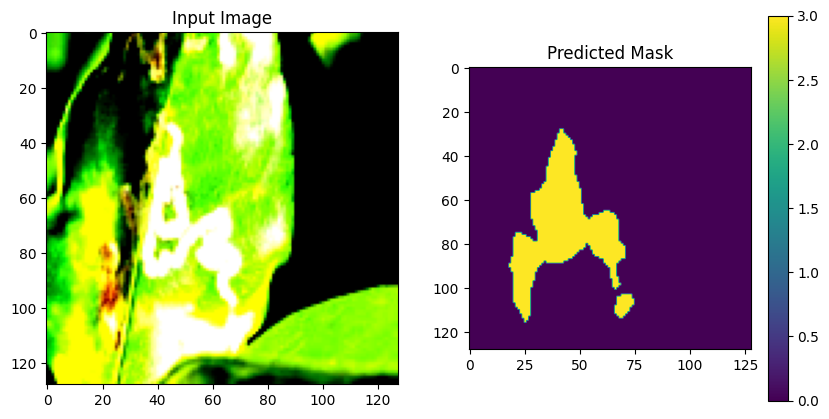

Unique labels in the predicted mask: ['Background' 'Leafminer']


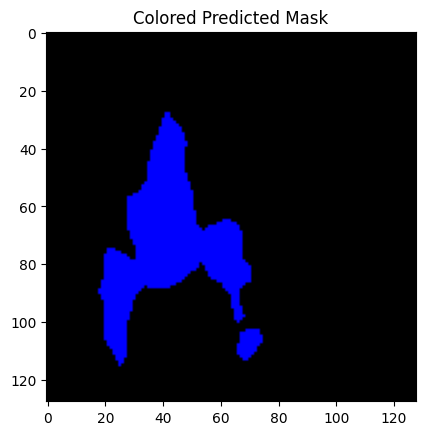

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7695861..1.7633053].


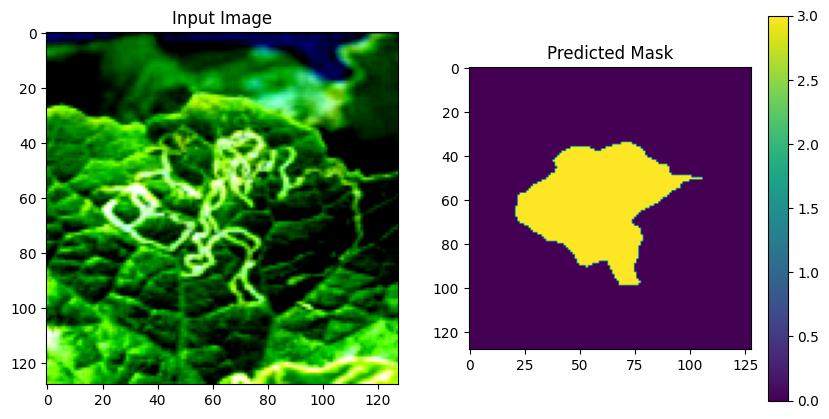

Unique labels in the predicted mask: ['Background' 'Leafminer']


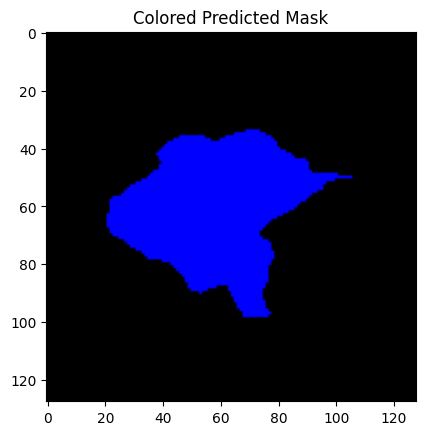

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4482791].


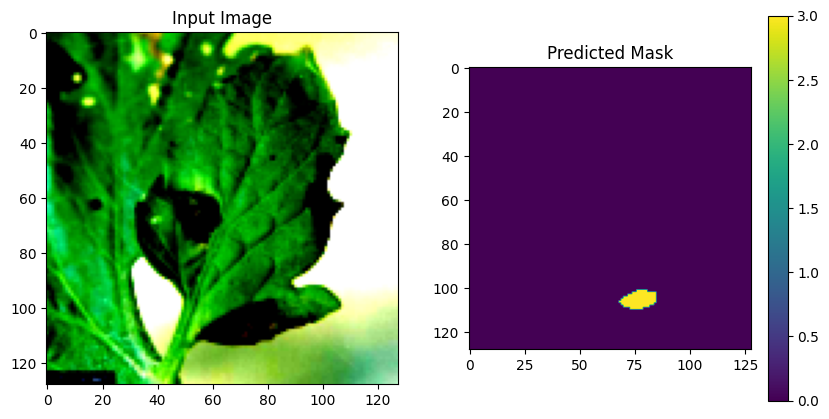

Unique labels in the predicted mask: ['Background' 'Leafminer']


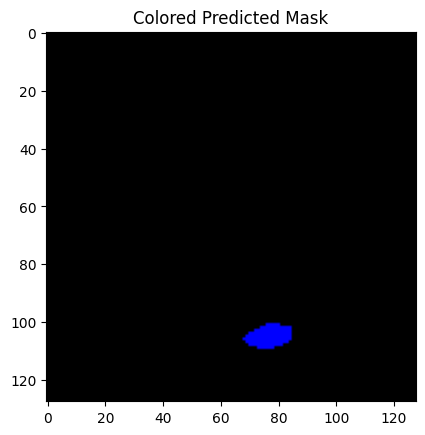

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4482791].


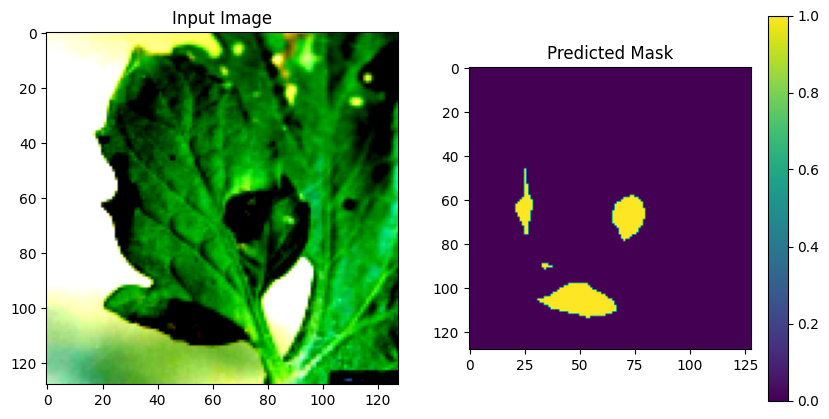

Unique labels in the predicted mask: ['Background' 'Early Blight']


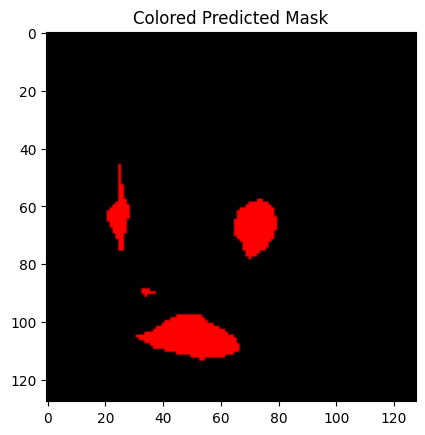

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4308496].


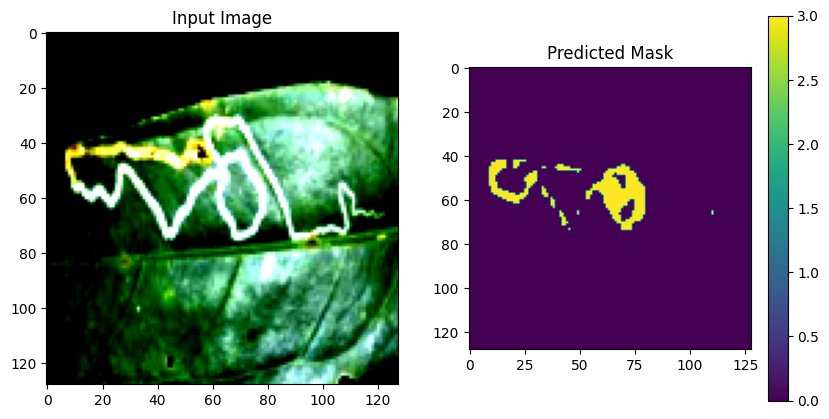

Unique labels in the predicted mask: ['Background' 'Leafminer']


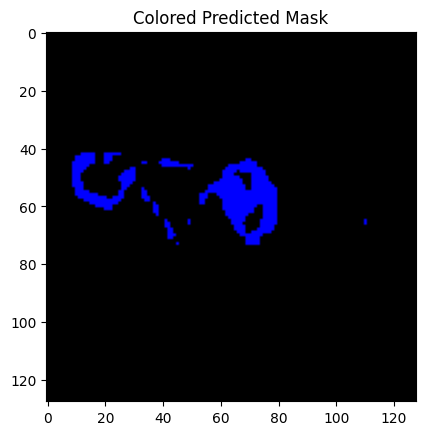

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4482791].


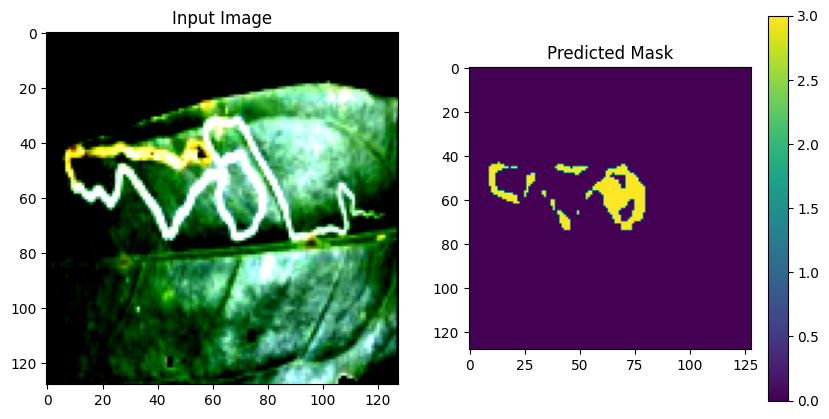

Unique labels in the predicted mask: ['Background' 'Leafminer']


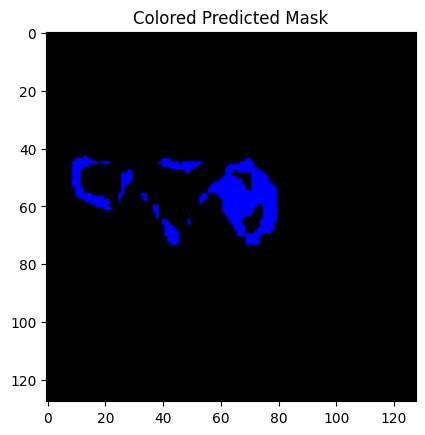

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4831376].


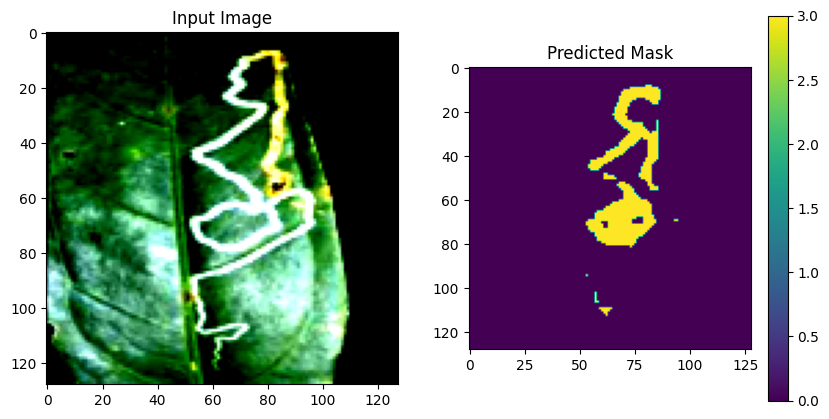

Unique labels in the predicted mask: ['Background' 'Leafminer']


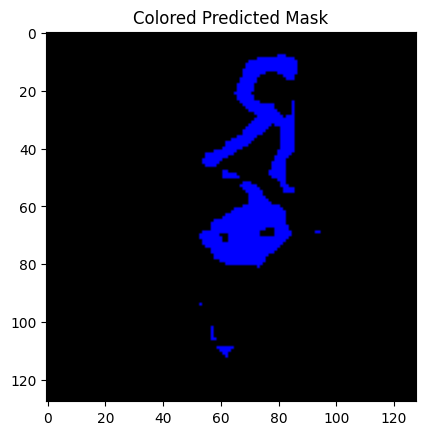

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.0259104].


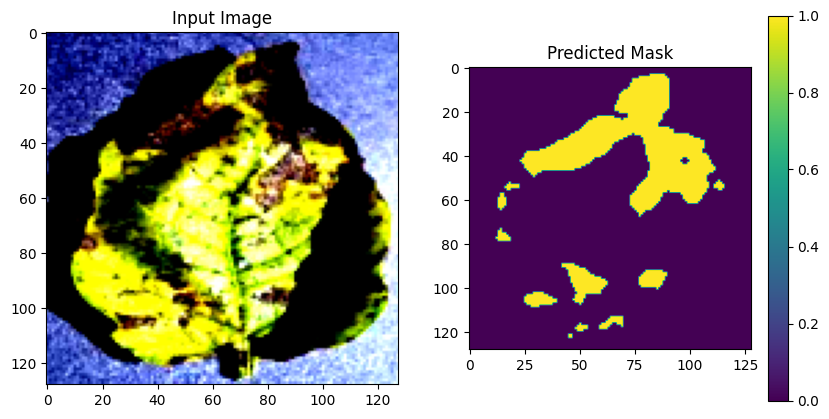

Unique labels in the predicted mask: ['Background' 'Early Blight']


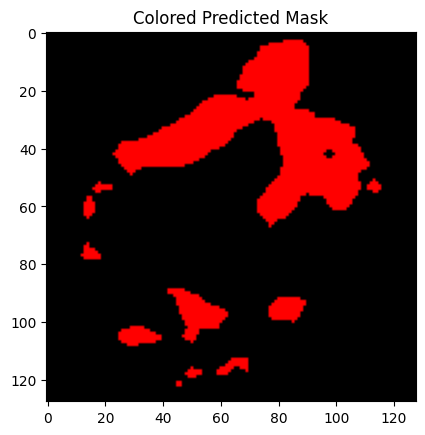

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.2914162].


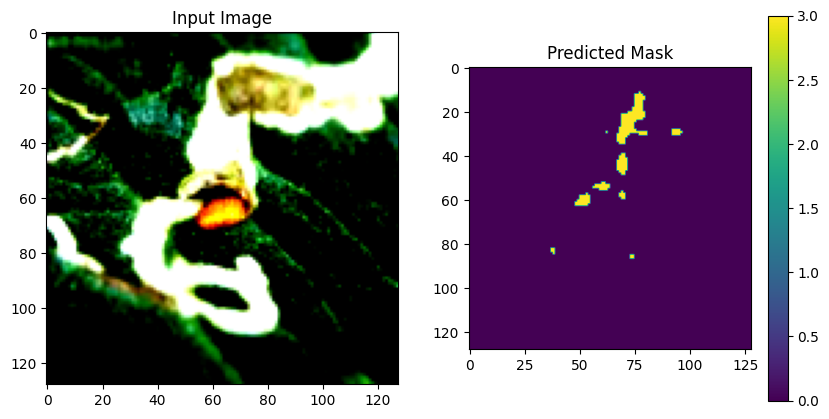

Unique labels in the predicted mask: ['Background' 'Leafminer']


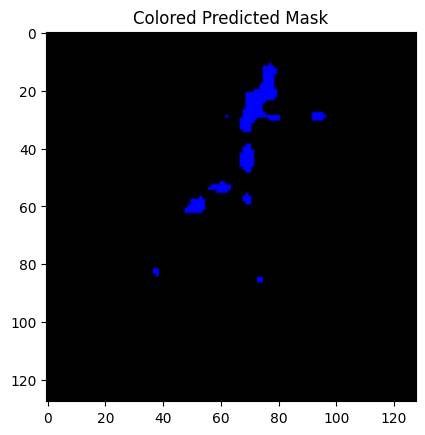

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.843908..2.2885156].


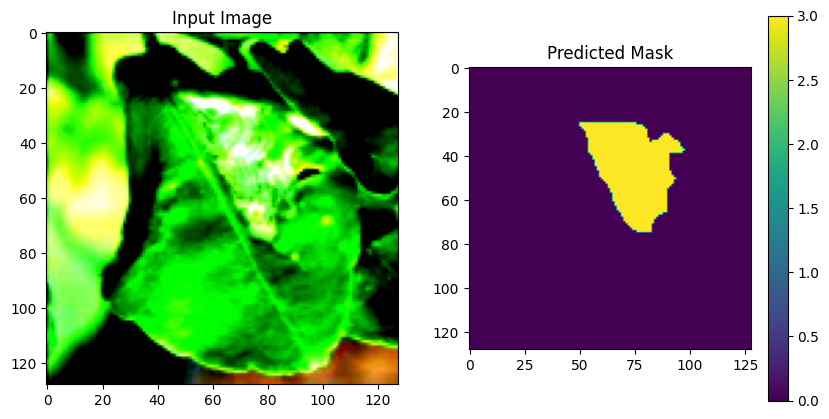

Unique labels in the predicted mask: ['Background' 'Leafminer']


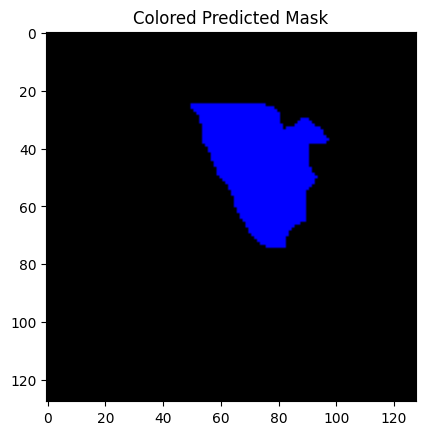

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8267832..2.3410363].


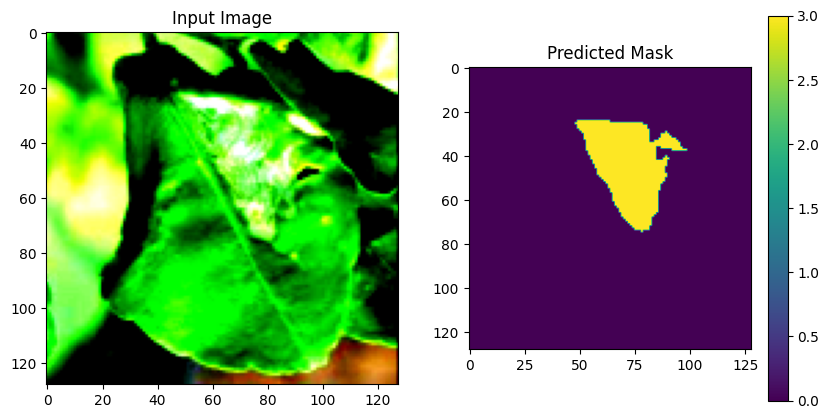

Unique labels in the predicted mask: ['Background' 'Leafminer']


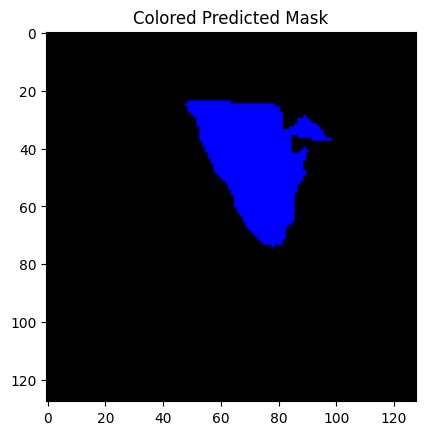

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.843908..2.3235295].


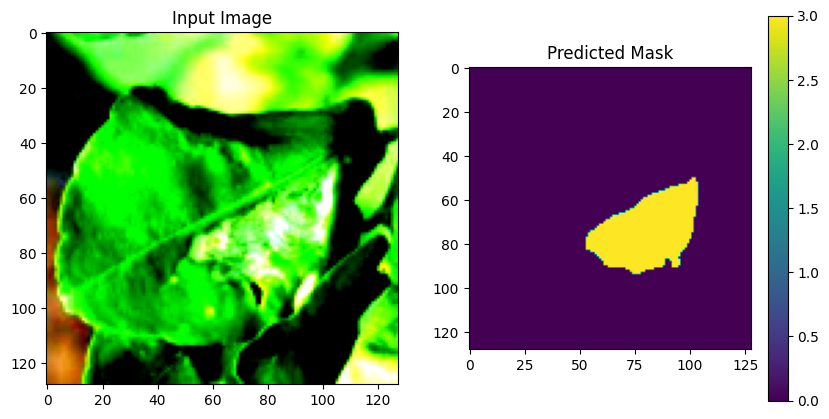

Unique labels in the predicted mask: ['Background' 'Leafminer']


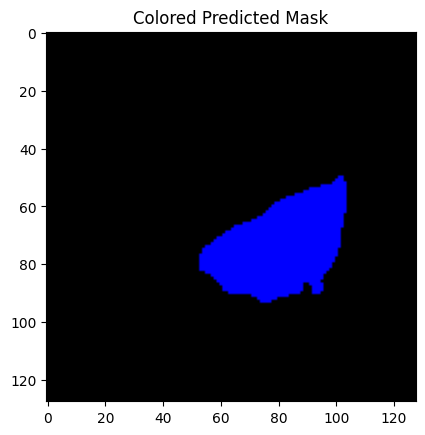

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.843908..2.64].


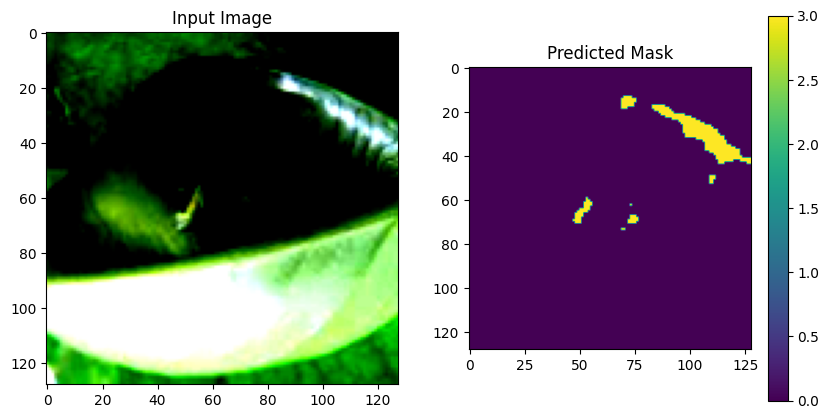

Unique labels in the predicted mask: ['Background' 'Leafminer']


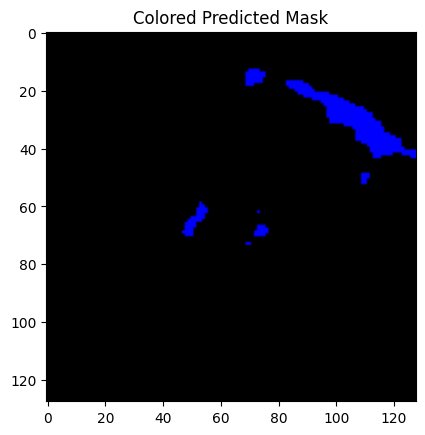

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8610327..2.6051416].


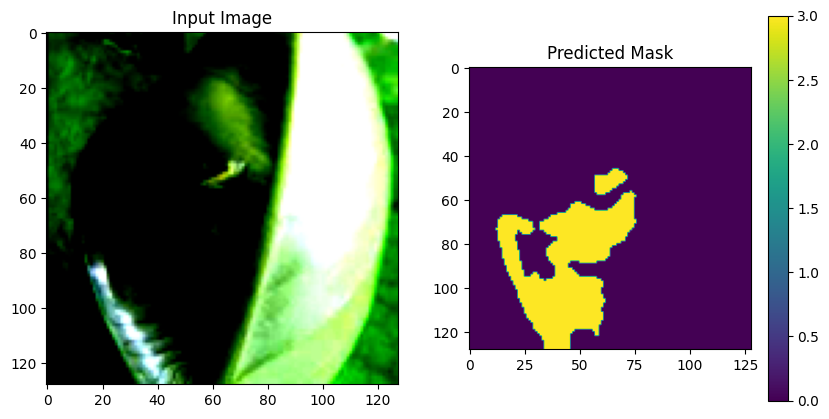

Unique labels in the predicted mask: ['Background' 'Leafminer']


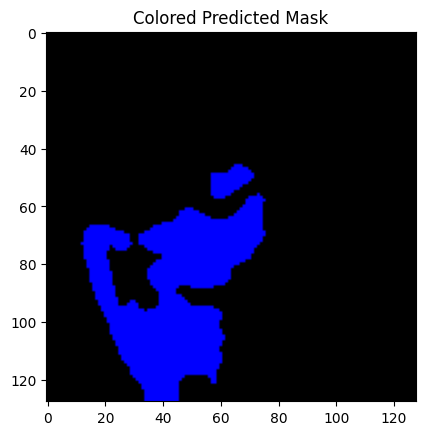

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8610327..2.64].


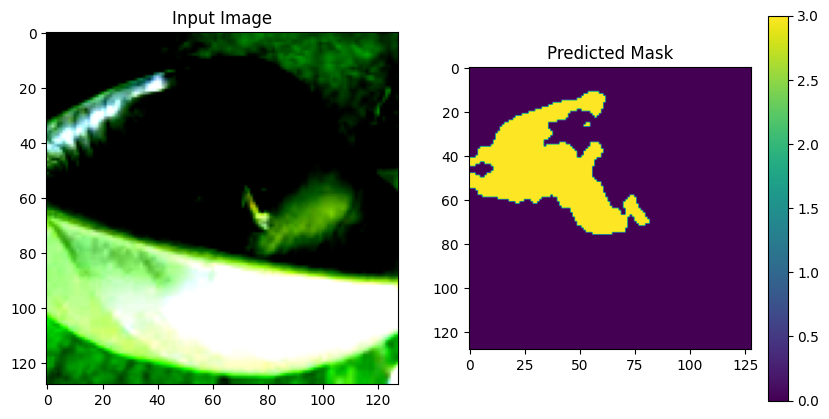

Unique labels in the predicted mask: ['Background' 'Leafminer']


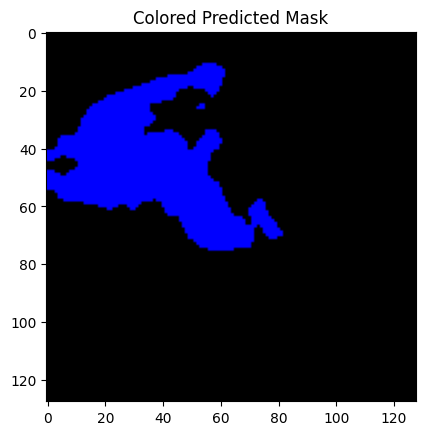

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.843908..2.5877128].


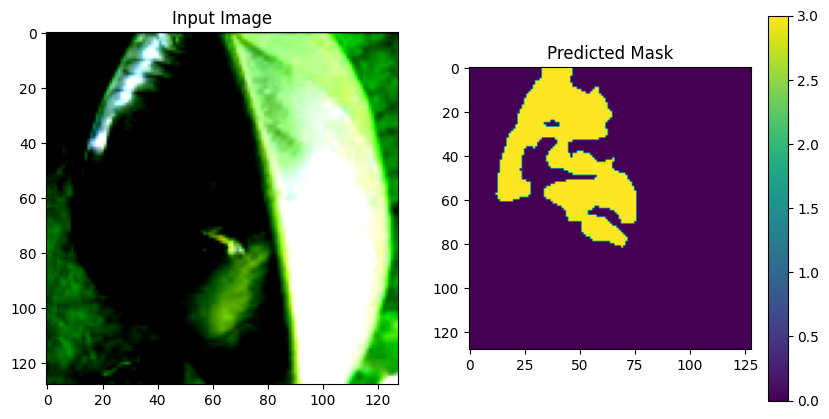

Unique labels in the predicted mask: ['Background' 'Leafminer']


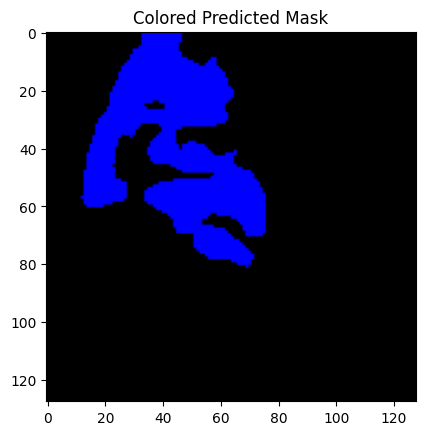

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.843908..2.5877128].


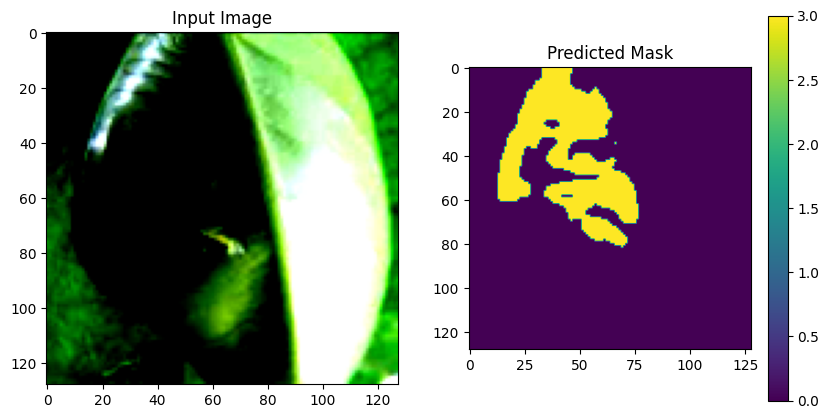

Unique labels in the predicted mask: ['Background' 'Leafminer']


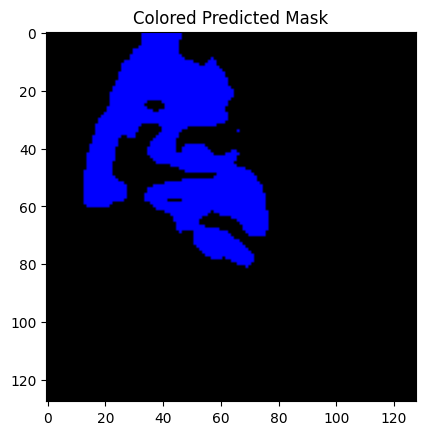

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8610327..2.6051416].


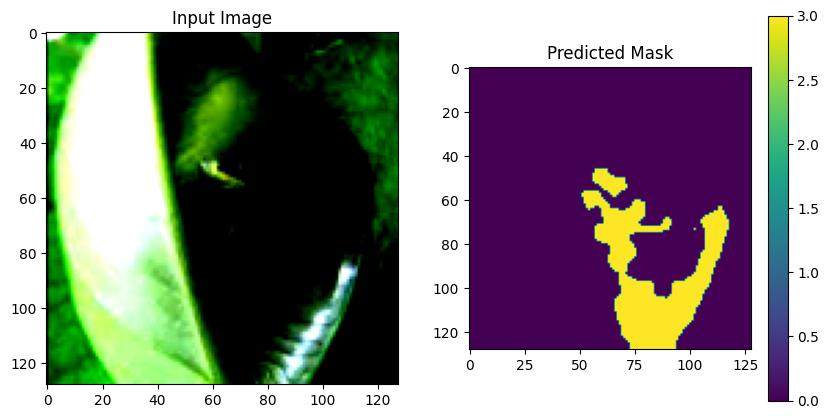

Unique labels in the predicted mask: ['Background' 'Leafminer']


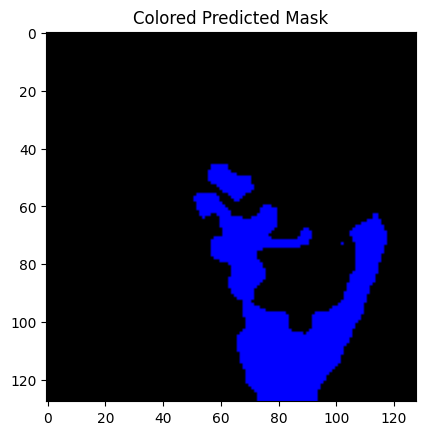

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].


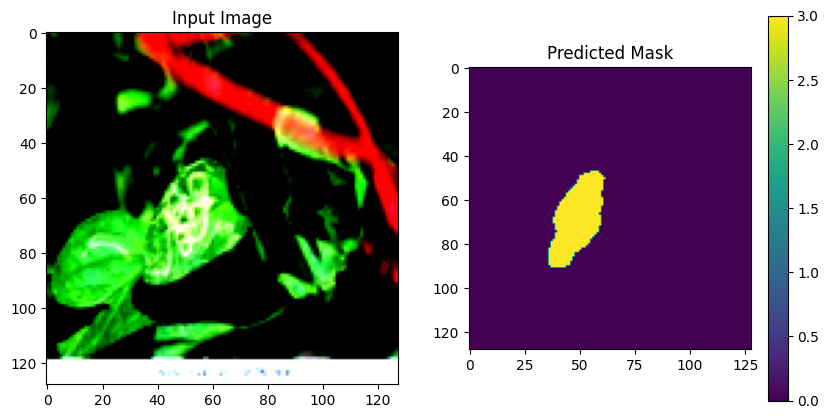

Unique labels in the predicted mask: ['Background' 'Leafminer']


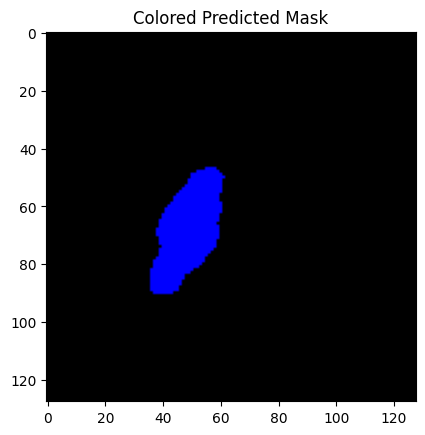

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].


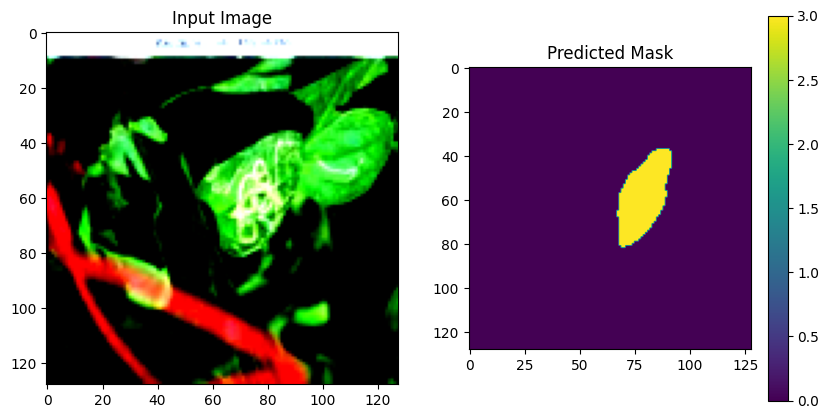

Unique labels in the predicted mask: ['Background' 'Leafminer']


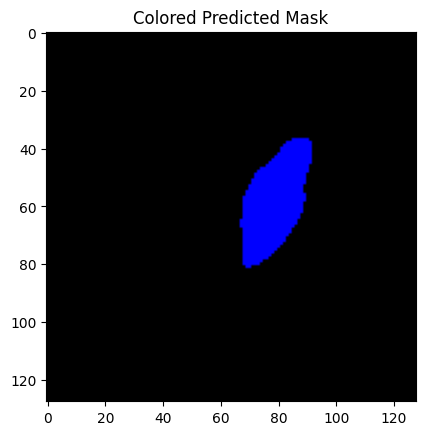

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8096584..2.0434172].


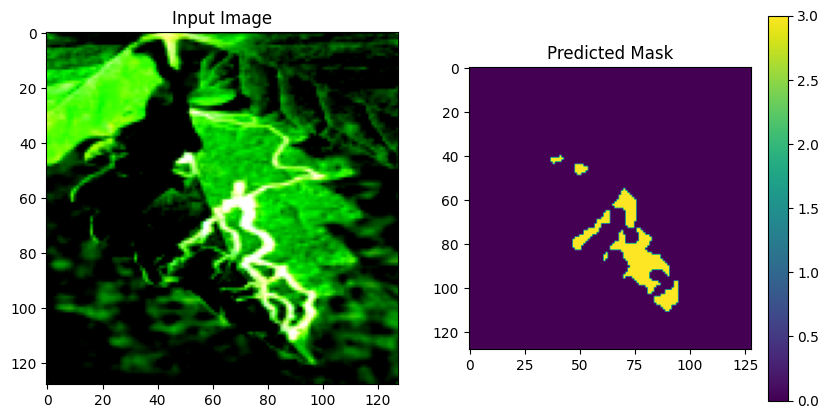

Unique labels in the predicted mask: ['Background' 'Leafminer']


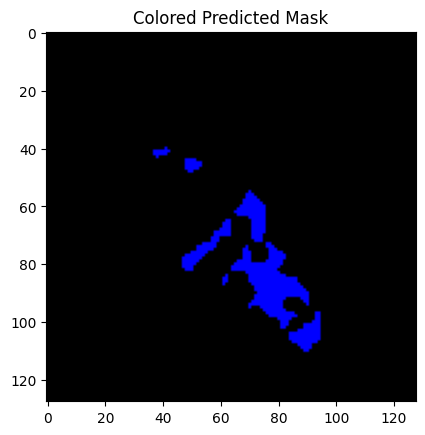

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.843908..2.0084033].


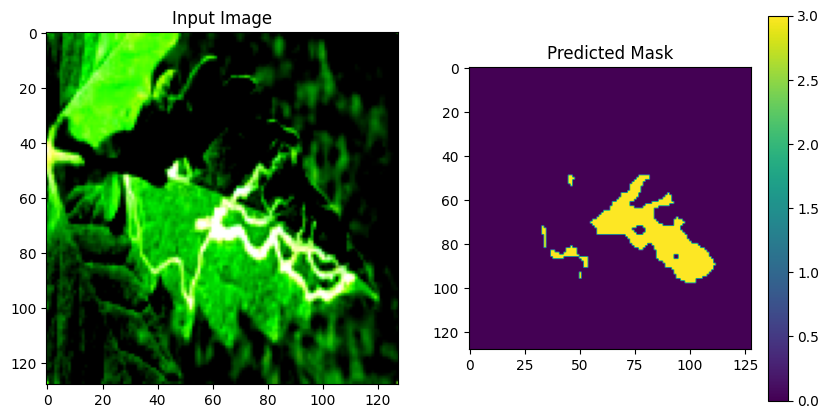

Unique labels in the predicted mask: ['Background' 'Leafminer']


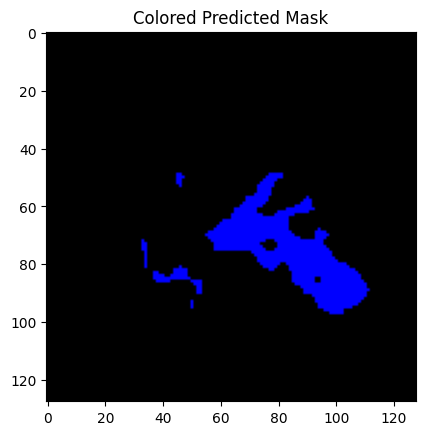

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.343704].


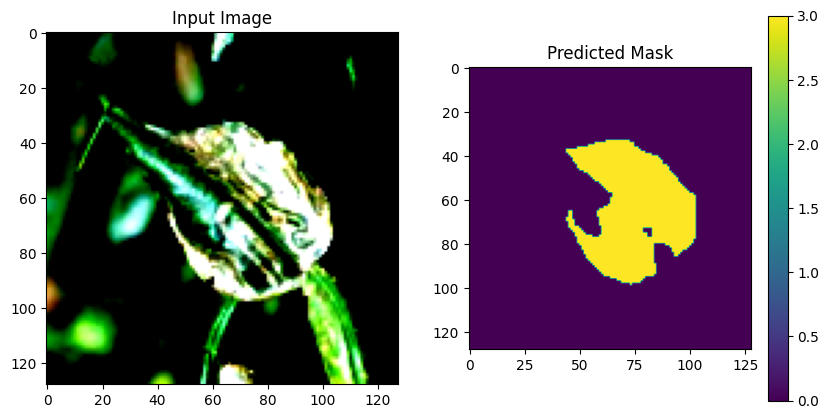

Unique labels in the predicted mask: ['Background' 'Leafminer']


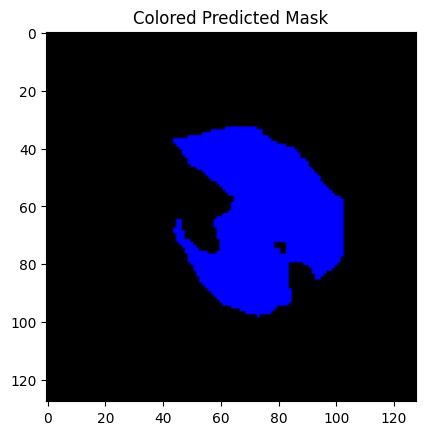

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3262744].


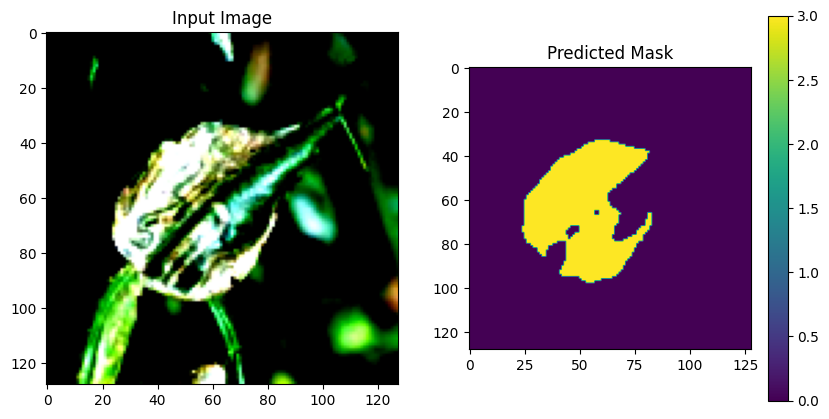

Unique labels in the predicted mask: ['Background' 'Leafminer']


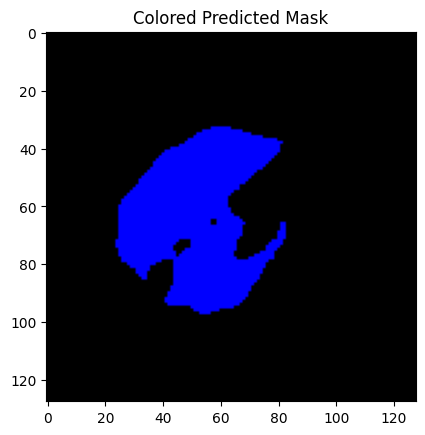

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3235295].


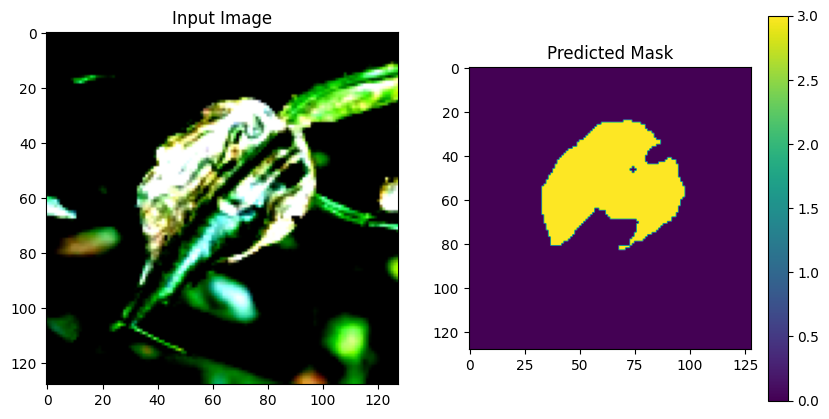

Unique labels in the predicted mask: ['Background' 'Leafminer']


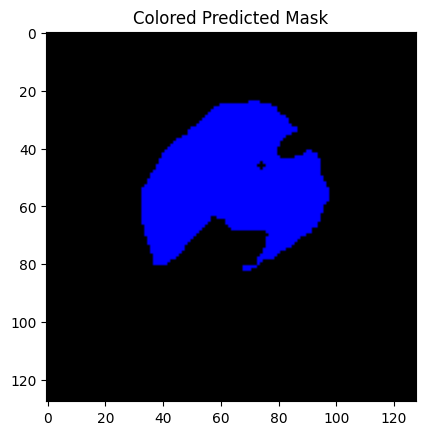

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.343704].


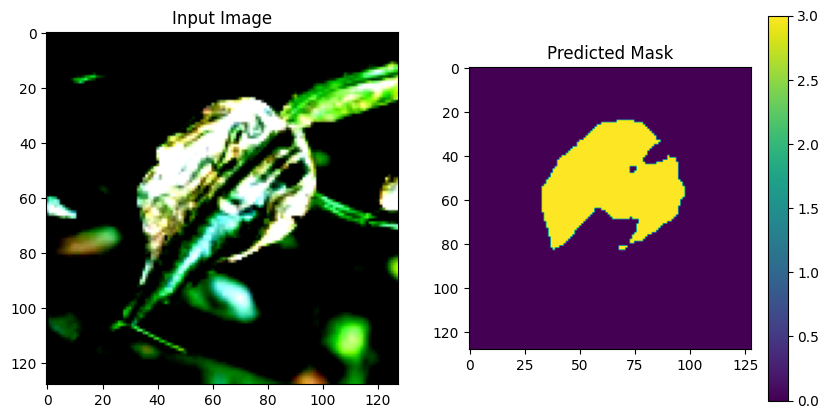

Unique labels in the predicted mask: ['Background' 'Leafminer']


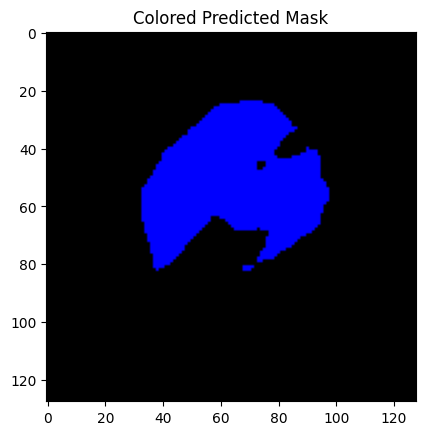

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5356624..2.169412].


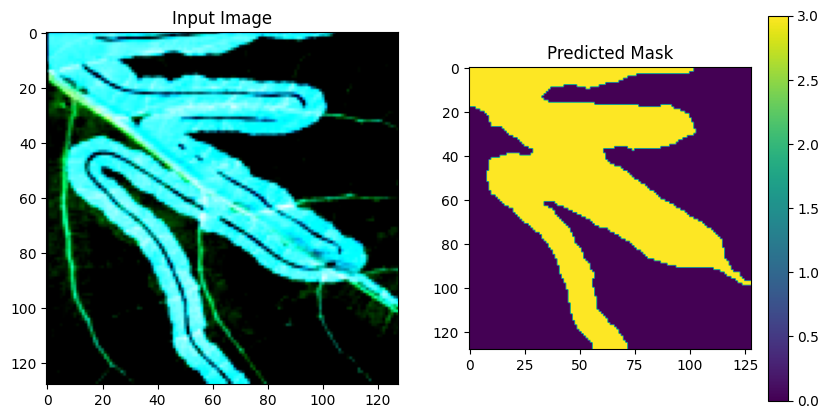

Unique labels in the predicted mask: ['Background' 'Leafminer']


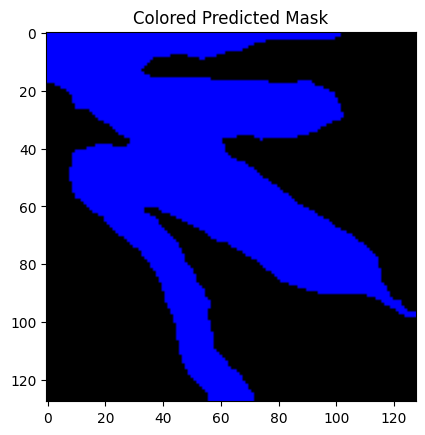

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5185376..2.1345534].


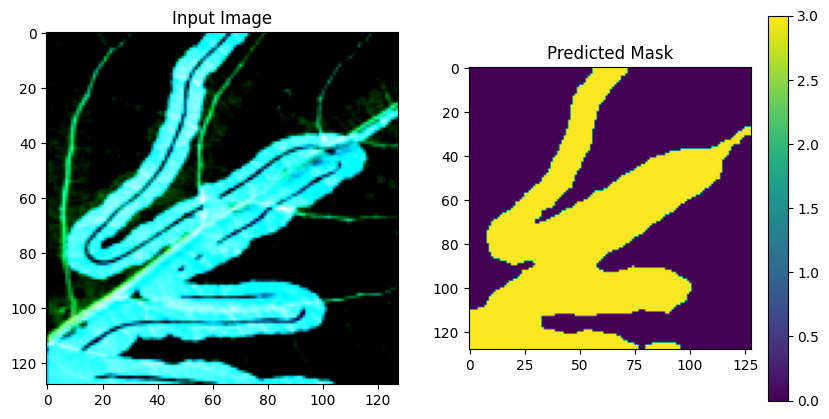

Unique labels in the predicted mask: ['Background' 'Leafminer']


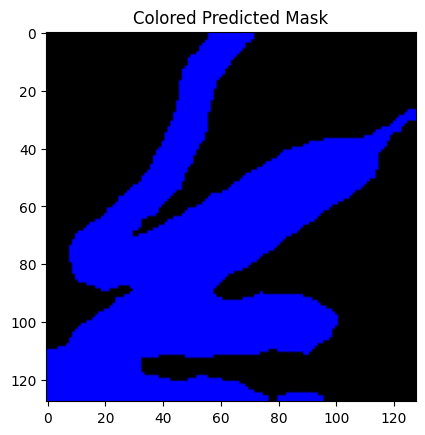

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.5245317].


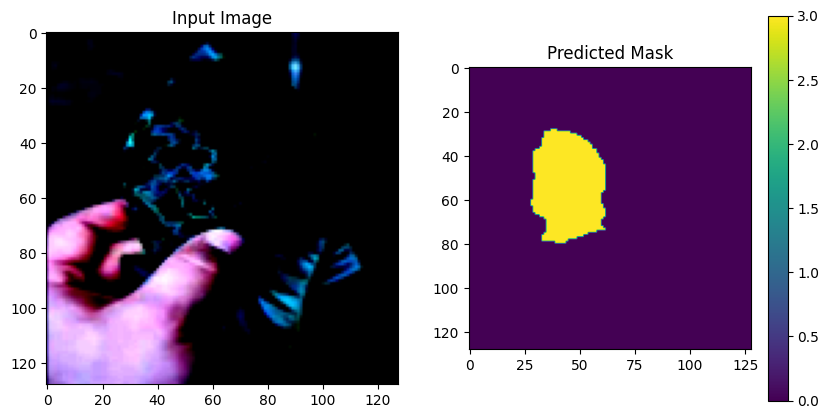

Unique labels in the predicted mask: ['Background' 'Leafminer']


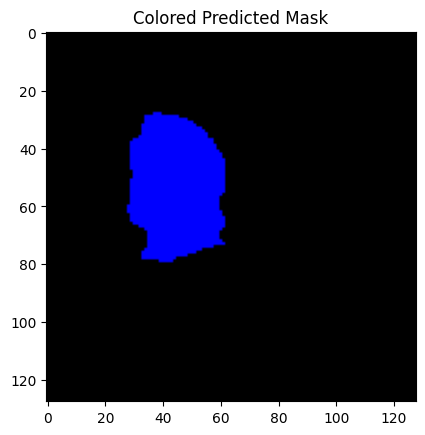

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.5768193].


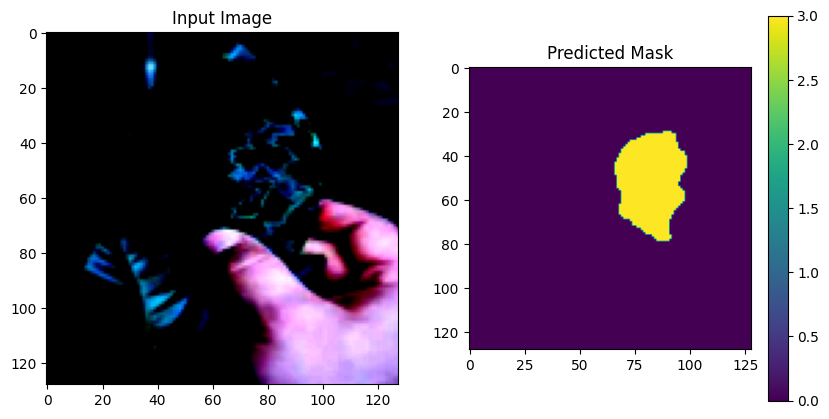

Unique labels in the predicted mask: ['Background' 'Leafminer']


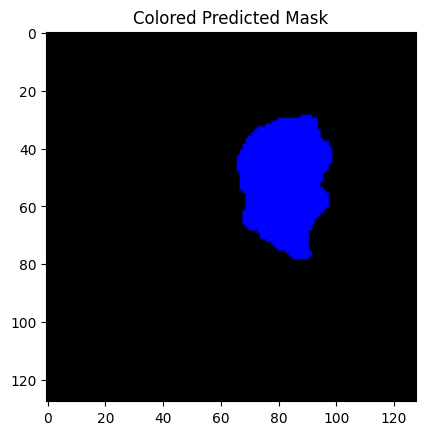

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.5942485].


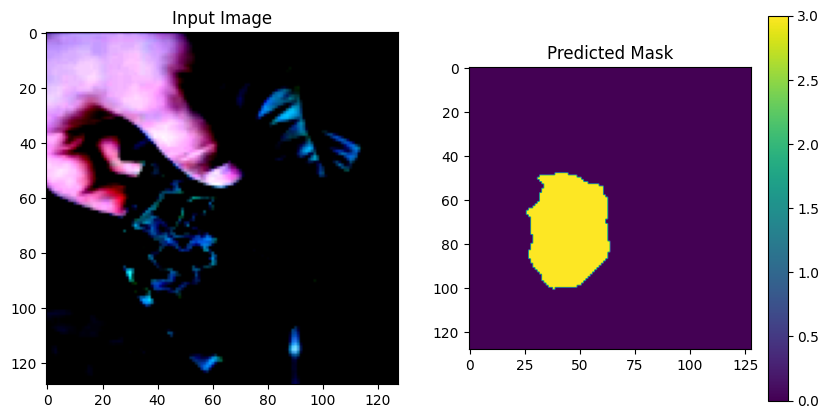

Unique labels in the predicted mask: ['Background' 'Leafminer']


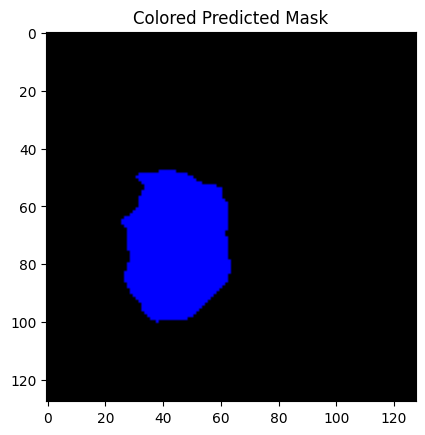

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.5245317].


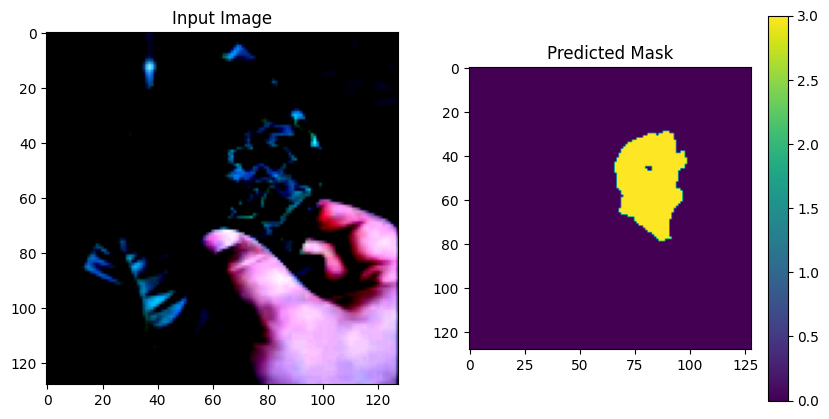

Unique labels in the predicted mask: ['Background' 'Leafminer']


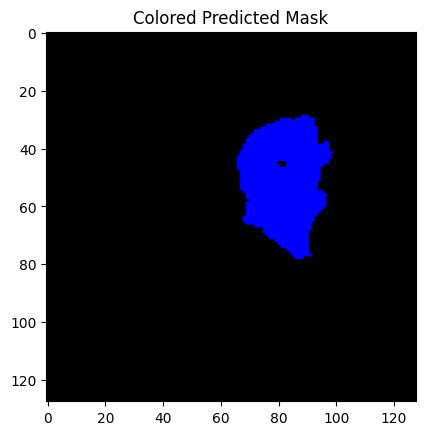

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.5942485].


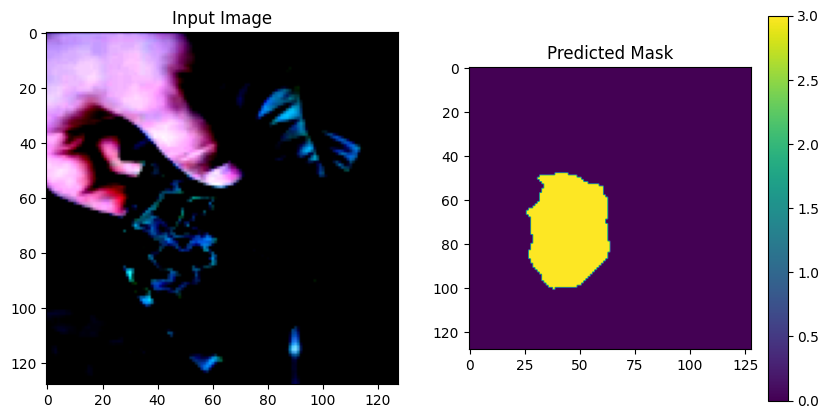

Unique labels in the predicted mask: ['Background' 'Leafminer']


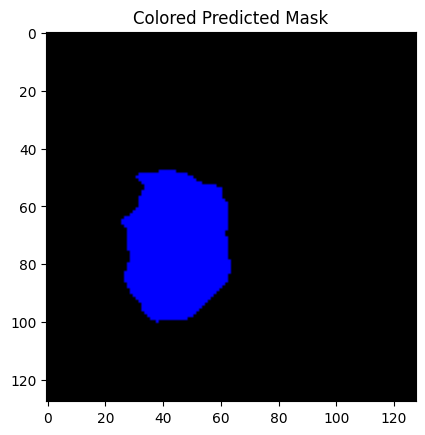

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6127234..1.8333333].


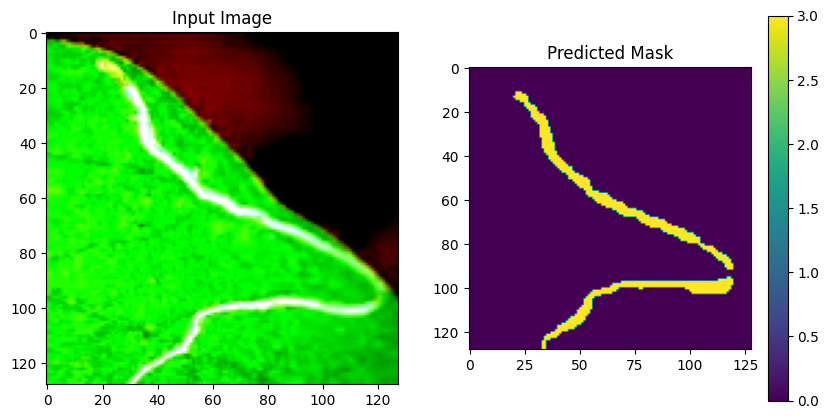

Unique labels in the predicted mask: ['Background' 'Leafminer']


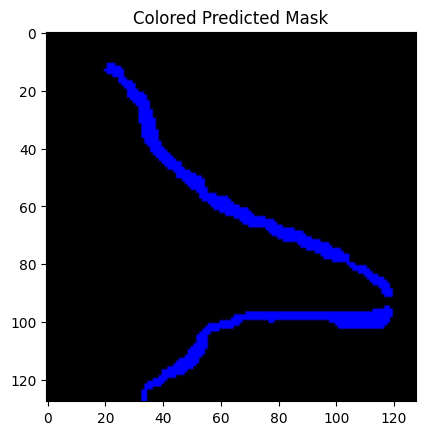

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6127234..1.8508403].


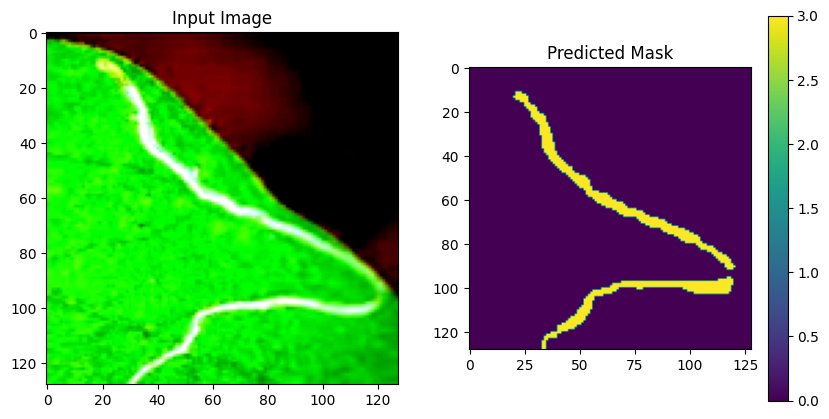

Unique labels in the predicted mask: ['Background' 'Leafminer']


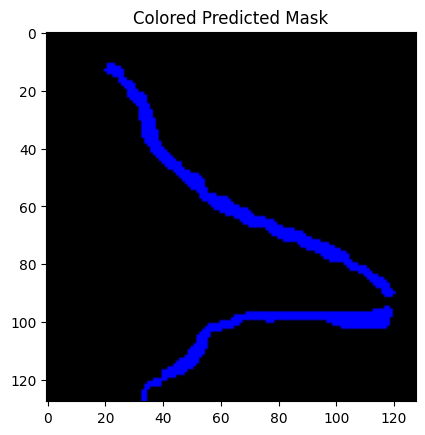

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6127234..1.8508403].


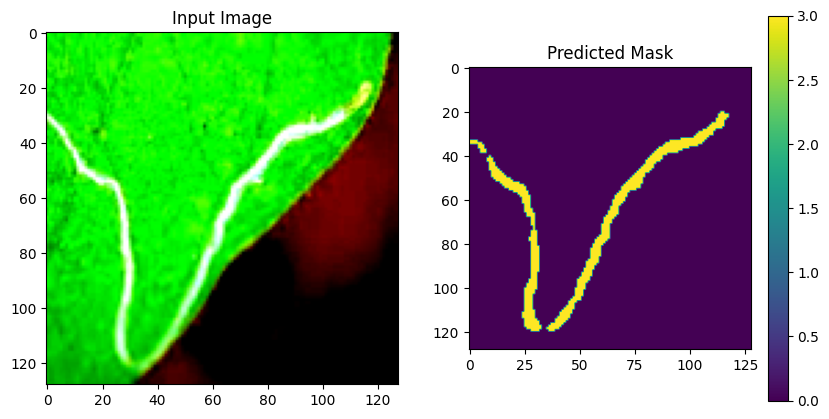

Unique labels in the predicted mask: ['Background' 'Leafminer']


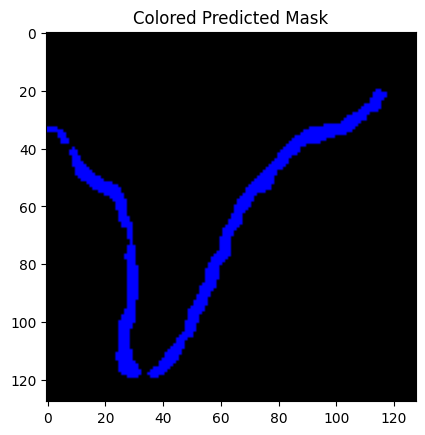

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7380952..2.4134207].


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


model.eval()
for i, batch in enumerate(test_dataloader):
    images = batch['pixel_values'].to(model.device)
    masks = batch['labels'].to(model.device)

    with torch.no_grad():
        outputs = model(images, masks)
        loss, logits = outputs

        upsampled_logits = nn.functional.interpolate(
            logits,
            size=masks.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
        
        predicted = upsampled_logits.argmax(dim=1)

    for j in range(images.size(0)):
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.title('Input Image')
        plt.imshow(images[j].permute(1, 2, 0).cpu().numpy())

    
        plt.subplot(1, 2, 2)
        plt.title('Predicted Mask')
        plt.imshow(predicted[j].cpu().numpy())
        plt.colorbar()
        plt.show()


        predicted_mask = predicted[j].cpu().numpy()
        vectorized_get = np.vectorize(lambda x: id2label.get(str(x), "Unknown"))

        label_mask = vectorized_get(predicted_mask)
        unique_labels = np.unique(label_mask)
        print("Unique labels in the predicted mask:", unique_labels)

        colored_mask = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)

        for class_idx, color in color_map.items():
            colored_mask[predicted_mask == class_idx] = color

        plt.figure()
        plt.title('Colored Predicted Mask')
        plt.imshow(colored_mask)
        plt.show()
